In [1]:
import numpy as np
# from mpl_toolkits.basemap import Basemap
import cartopy.crs as ccrs
import cartopy
from matplotlib import pyplot as plt
import time
from matplotlib import colors
from mpl_toolkits.axes_grid1 import make_axes_locatable
import copy
import matplotlib as mpl

## Load Data and NAN

In [2]:
precip = np.load('nc-data/daily_clima_no_leap.npy')
lat = np.load('nc-data/lat_int.npy')
lon = np.load('nc-data/lon_int.npy')
print(lat.shape, ' ', lon.shape, ' ', precip.shape)

cdata = precip.reshape(precip.shape[0], -1)
cdata = np.transpose(cdata)
print(cdata.shape) # sample, features
cdata = np.cbrt(cdata) # cubic root
cmin = np.min(cdata, axis=1)
cmax = np.max(cdata, axis=1)
print(cmin.shape)
rank = cdata.copy()
for i in range(rank.shape[0]):
    rank[i] = (rank[i]-cmin[i])/(cmax[i]-cmin[i]) # rank to [0,1]
# rank[np.isnan(rank)]=-100
print(np.nanmin(rank), ' ', np.nanmax(rank))


nan_ind = np.unique(np.argwhere(np.isnan(rank))[:,0])
nan_rank = np.delete(rank, nan_ind, axis=0)
print(nan_rank.shape)

(80,)   (148,)   (365, 80, 148)
(11840, 365)
(11840,)
0.0   1.0
(5955, 365)


In [3]:
print(np.min(lon), ' ', np.max(lon))
print(np.min(lat), ' ', np.max(lat))
print(np.shape(lon), ' ', np.shape(lat))
print(lat[0]-lat[1], ' ', lat[10]-lat[11])

230.75   304.25
12.25   51.75
(148,)   (80,)
0.5   0.5


In [4]:
def findindex(x, nan_index):
    count = 0
    for i in nan_index:
        if x>i: count+=1
    return x-count
def inspect(reverse, total):
    fig = plt.figure(figsize=(13,8))
    ax = plt.subplot(111, projection=ccrs.PlateCarree())
    ax.coastlines(alpha=0.2)
    ax.add_feature(cartopy.feature.BORDERS, alpha=0.1)
    ax.add_feature(cartopy.feature.STATES, alpha=0.1)
    xx, yy = np.meshgrid(lon, lat)
    masked_reverse = np.ma.array(reverse, mask=reverse<0)
    palette = copy.copy(mpl.cm.get_cmap("tab20", total))
    palette.set_bad('b', 0)
    scat = ax.scatter(xx, yy, c=masked_reverse.reshape(80, 148), cmap=plt.cm.get_cmap('tab20', total), 
                     vmin=0.5, vmax=total+0.5, transform=ccrs.PlateCarree())
    ax.set_extent([230.75, 304.25, 12.25, 51.75], crs=ccrs.PlateCarree())
    divider = make_axes_locatable(ax)
    cax1 = divider.new_horizontal(size="5%", pad=0.1, axes_class=plt.Axes)
    fig.add_axes(cax1)
    fig.colorbar(scat, cax=cax1, orientation='vertical', ticks=np.arange(0, total+1))
    plt.show()
def inspect_individual(reverse, total):
    for i in range(1,total+1):
        fig = plt.figure(figsize=(10,5))
        ax = plt.subplot(111, projection=ccrs.PlateCarree(central_longitude=180))
        ax.coastlines(alpha=0.2)
        ax.add_feature(cartopy.feature.BORDERS, alpha=0.1)
        ax.add_feature(cartopy.feature.STATES, alpha=0.1)
        xx, yy = np.meshgrid(lon, lat)

        temp = reverse.copy()
        temp[temp!=i]=-1
        masked_temp = np.ma.array(temp, mask=temp<0)
        palette = copy.copy(mpl.cm.get_cmap("tab20", total))
        palette.set_bad('b', 0)
        scat = ax.scatter(xx, yy, c=masked_temp.reshape(80, 148), cmap=plt.cm.get_cmap('tab20', total), 
                          transform=ccrs.PlateCarree())
        ax.set_extent([230.74, 304.25, 12.25, 51.75])

        plt.title(str(i)+'th cluster')
        plt.show()


## 10 clusters

In [5]:
space = np.genfromtxt('space_global_10.txt', delimiter=',')
print(space.shape)
bmu = space[:,0]
print(np.unique(bmu, return_counts=True))
reverse = np.zeros(11840)
for i in range(11840):
    if i in nan_ind:
        reverse[i]=-1
    else:
        cindex = findindex(i, nan_ind)
        reverse[i]=bmu[cindex]
print(np.unique(reverse, return_counts=True))

(5955, 2)
(array([ 1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10.]), array([724, 586, 853, 325, 930, 605, 524, 425, 327, 656]))
(array([-1.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10.]), array([5885,  724,  586,  853,  325,  930,  605,  524,  425,  327,  656]))


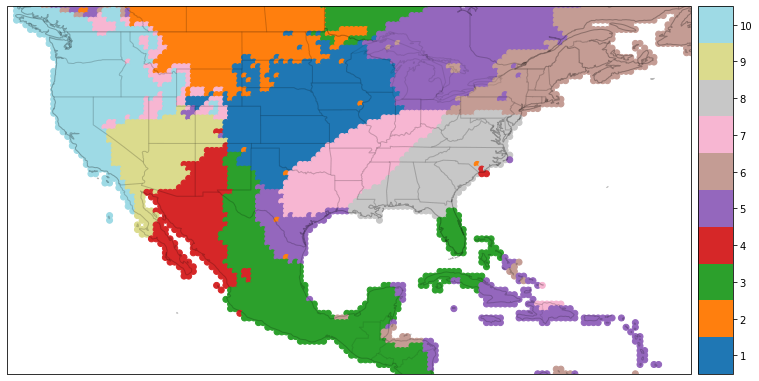

In [6]:
inspect(reverse, 10)

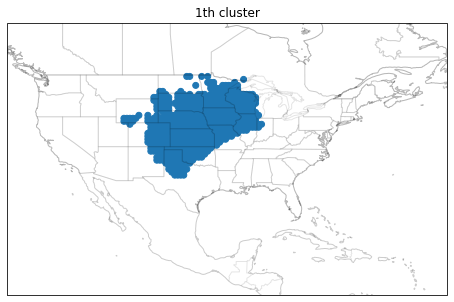

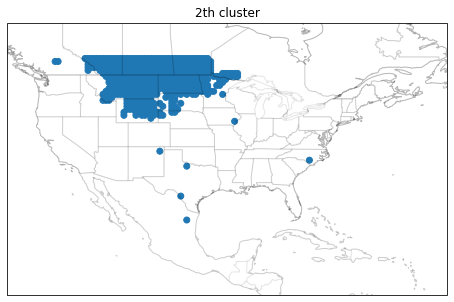

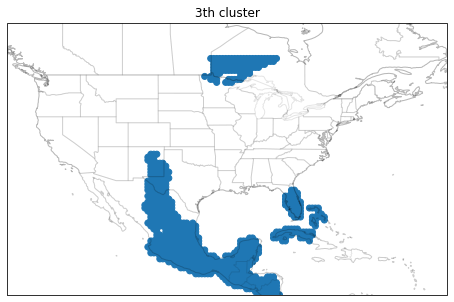

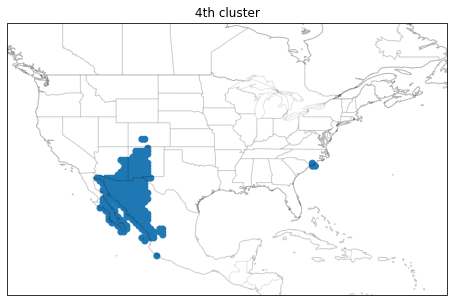

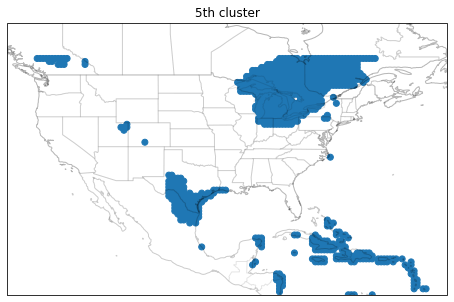

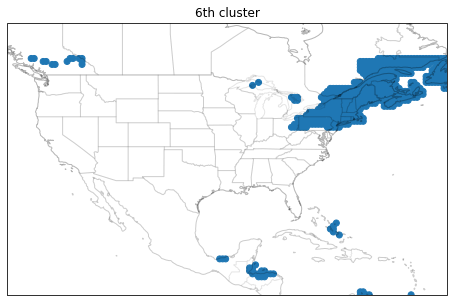

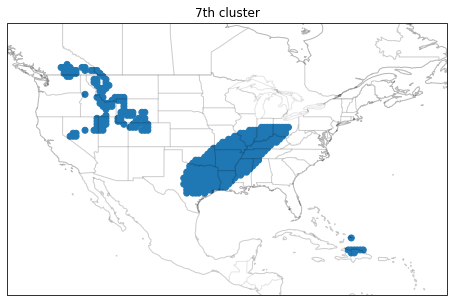

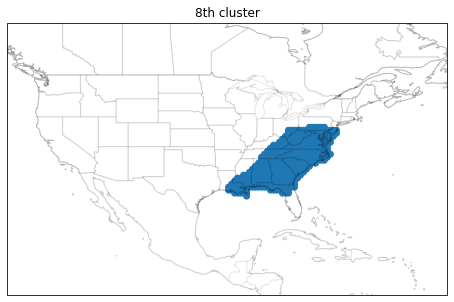

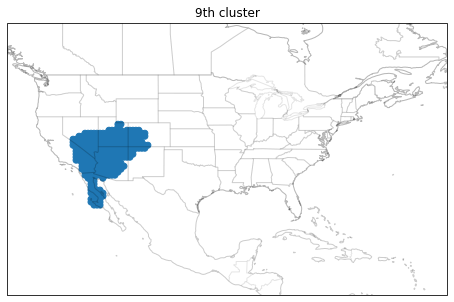

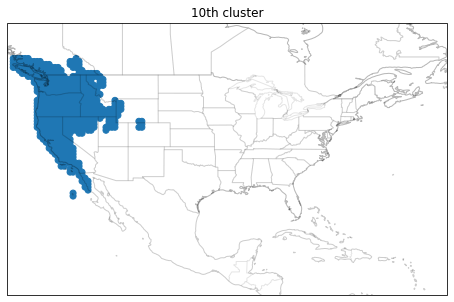

In [7]:
inspect_individual(reverse,10)

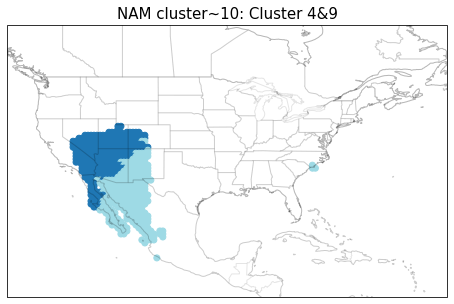

In [8]:
fig = plt.figure(figsize=(10,5))
ax = plt.subplot(111, projection=ccrs.PlateCarree(central_longitude=180))
ax.coastlines(alpha=0.2)
ax.add_feature(cartopy.feature.BORDERS, alpha=0.1)
ax.add_feature(cartopy.feature.STATES, alpha=0.1)
xx, yy = np.meshgrid(lon, lat)

temp = reverse.copy()
clusters=[5,9]
for i in range(len(temp)):
    if temp[i]!=4 and temp[i]!=9:
        temp[i]=-1
    if temp[i]==4:
        temp[i]=1
    if temp[i]==9:
        temp[i]=0
masked_temp = np.ma.array(temp, mask=temp<0)

palette = copy.copy(mpl.cm.get_cmap("tab20", 2))
palette.set_bad('b', 0)
scat = ax.scatter(xx, yy, c=masked_temp.reshape(80, 148), cmap=plt.cm.get_cmap('tab20', 2), 
                  transform=ccrs.PlateCarree())
ax.set_extent([230.74, 304.25, 12.25, 51.75])
plt.title('NAM cluster~10: Cluster 4&9', fontsize=15)
# plt.savefig('10C-NAM.png', bbox_inches = 'tight', pad_inches = 0)
plt.show()
nam_10 = temp.copy()

In [9]:
print(np.unique(nam_10, return_counts=True))

(array([-1.,  0.,  1.]), array([11188,   327,   325]))


## 11 clusters

In [10]:
space = np.genfromtxt('space_global_11.txt', delimiter=',')
print(space.shape)
bmu = space[:,0]
print(np.unique(bmu, return_counts=True))
reverse = np.zeros(11840)
for i in range(11840):
    if i in nan_ind:
        reverse[i]=-1
    else:
        cindex = findindex(i, nan_ind)
        reverse[i]=bmu[cindex]
print(np.unique(reverse, return_counts=True))

(5955, 2)
(array([ 1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11.]), array([683, 558, 623, 565, 330, 758, 690, 561, 439, 370, 378]))
(array([-1.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11.]), array([5885,  683,  558,  623,  565,  330,  758,  690,  561,  439,  370,
        378]))


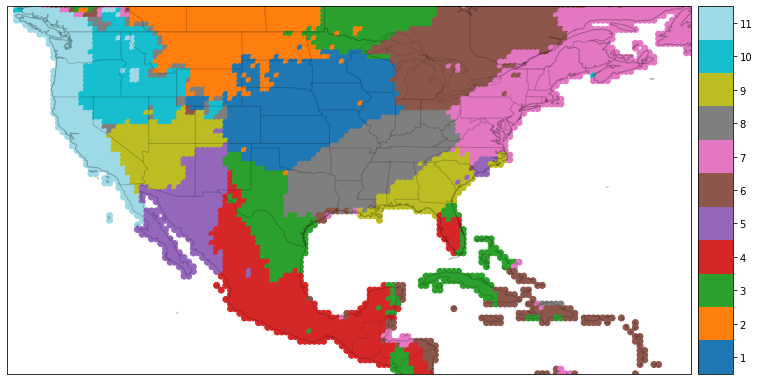

In [11]:
inspect(reverse, total=11)

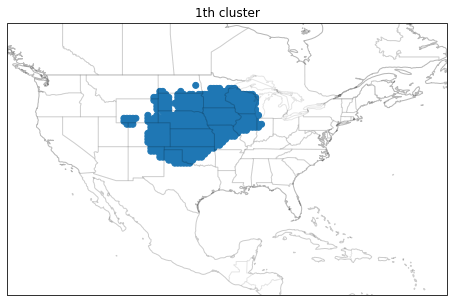

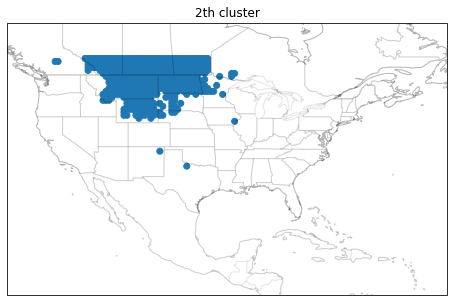

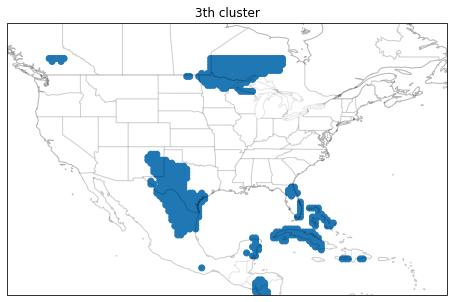

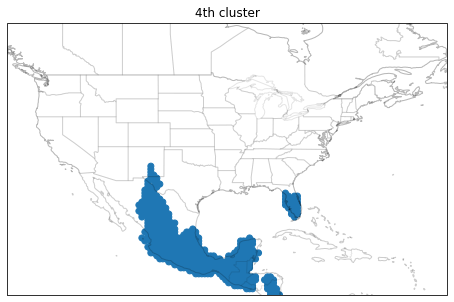

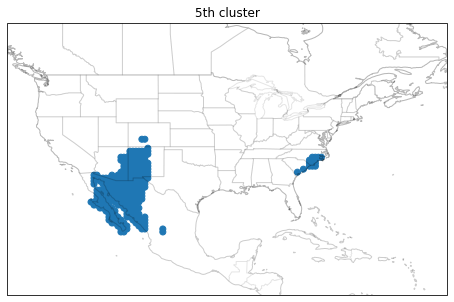

...

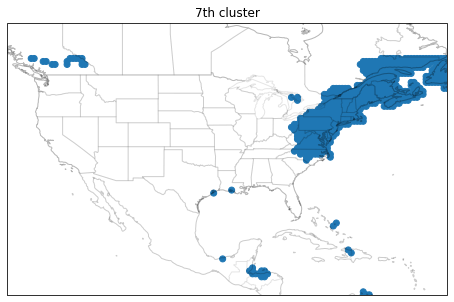

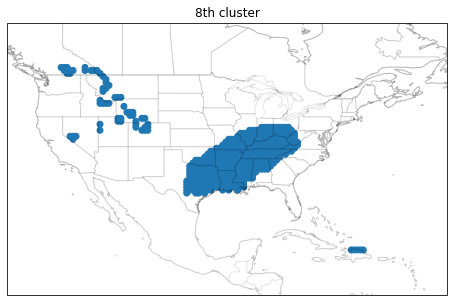

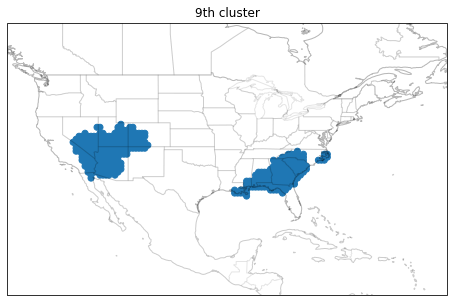

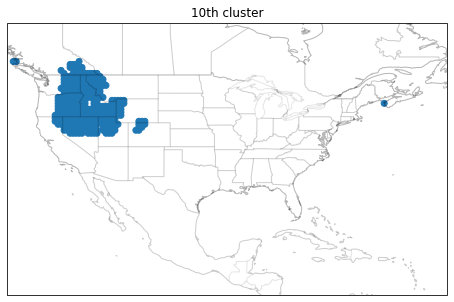

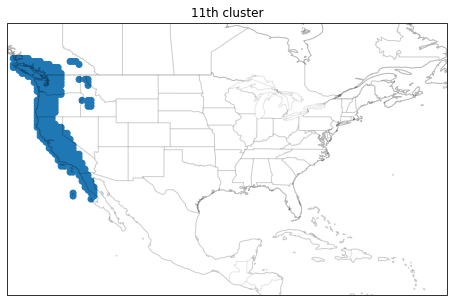

In [12]:
inspect_individual(reverse, 11)

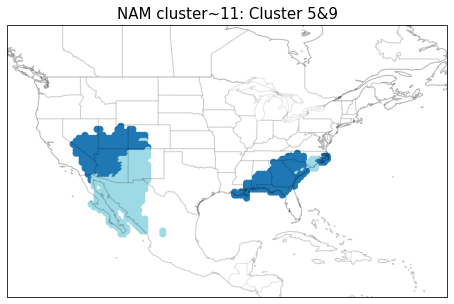

In [13]:
fig = plt.figure(figsize=(10,5))
ax = plt.subplot(111, projection=ccrs.PlateCarree(central_longitude=180))
ax.coastlines(alpha=0.2)
ax.add_feature(cartopy.feature.BORDERS, alpha=0.1)
ax.add_feature(cartopy.feature.STATES, alpha=0.1)
xx, yy = np.meshgrid(lon, lat)
temp = reverse.copy()
clusters=[5,9]
for i in range(len(temp)):
    if temp[i]!=5 and temp[i]!=9:
        temp[i]=-1
    if temp[i]==5:
        temp[i]=1
    if temp[i]==9:
        temp[i]=0
masked_temp = np.ma.array(temp, mask=temp<0)
palette = copy.copy(mpl.cm.get_cmap("tab20", 2))
palette.set_bad('b', 0)
scat = ax.scatter(xx, yy, c=masked_temp.reshape(80, 148), cmap=plt.cm.get_cmap('tab20', 2), 
                  transform=ccrs.PlateCarree())
ax.set_extent([230.74, 304.25, 12.25, 51.75])
plt.title('NAM cluster~11: Cluster 5&9', fontsize=15)
# plt.savefig('11C-NAM.png', bbox_inches = 'tight', pad_inches = 0)
plt.show()
nam_11 = temp.copy()

## 12 clusters

In [14]:
space = np.genfromtxt('space_global_12.txt', delimiter=',')
print(space.shape)
bmu = space[:,0]
print(np.unique(bmu, return_counts=True))

reverse = np.zeros(11840)
for i in range(11840):
    if i in nan_ind:
        reverse[i]=-1
    else:
        cindex = findindex(i, nan_ind)
        reverse[i]=bmu[cindex]
print(np.unique(reverse, return_counts=True))

(5955, 2)
(array([ 1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12.]), array([561, 675, 601, 554, 306, 745, 592, 427, 424, 296, 295, 479]))
(array([-1.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12.]), array([5885,  561,  675,  601,  554,  306,  745,  592,  427,  424,  296,
        295,  479]))


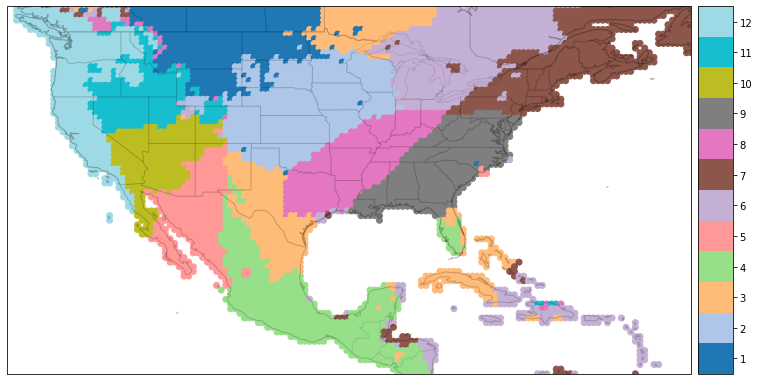

In [15]:
inspect(reverse, total=12)

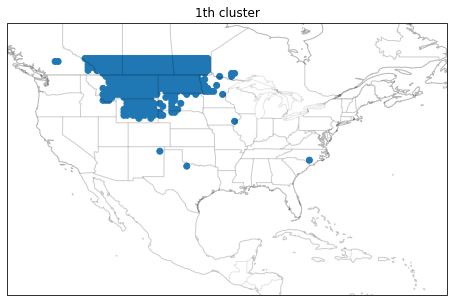

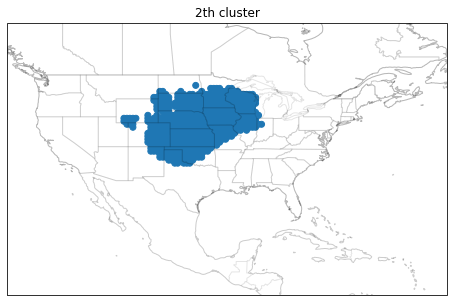

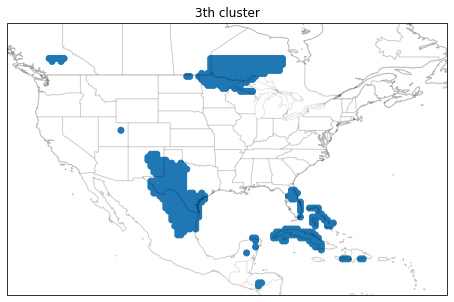

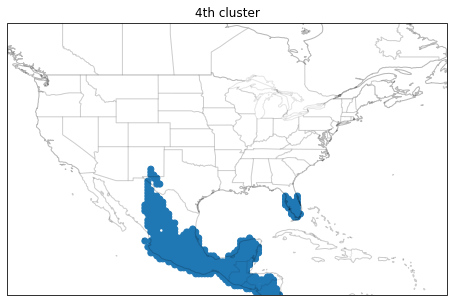

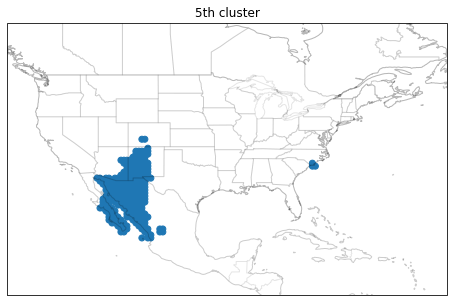

...

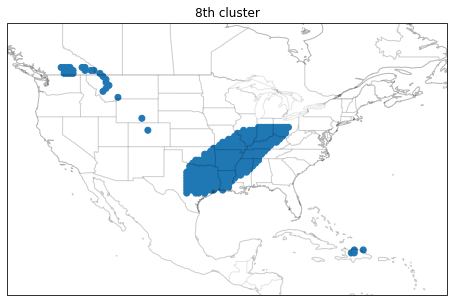

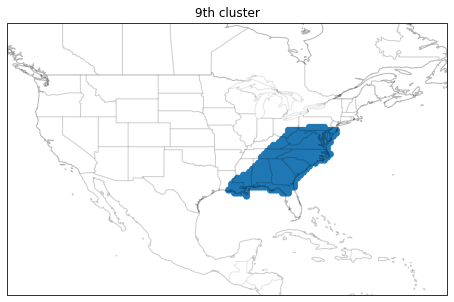

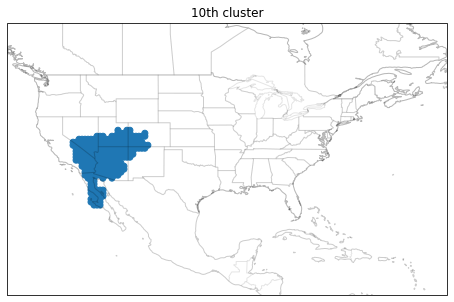

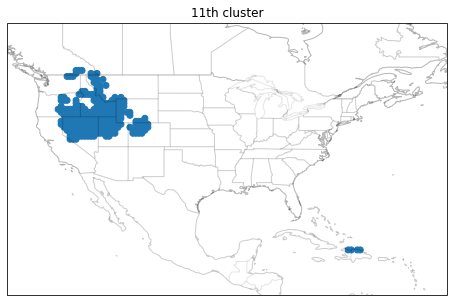

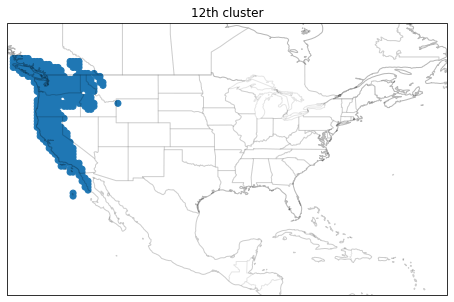

In [16]:
inspect_individual(reverse, 12)

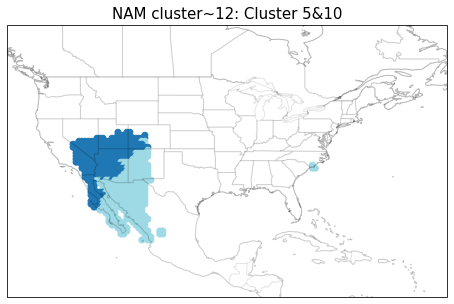

In [17]:
fig = plt.figure(figsize=(10,5))
ax = plt.subplot(111, projection=ccrs.PlateCarree(central_longitude=180))
ax.coastlines(alpha=0.2)
ax.add_feature(cartopy.feature.BORDERS, alpha=0.1)
ax.add_feature(cartopy.feature.STATES, alpha=0.1)
xx, yy = np.meshgrid(lon, lat)
temp = reverse.copy()
clusters=[5,10]
for i in range(len(temp)):
    if temp[i]!=5 and temp[i]!=10:
        temp[i]=-1
    if temp[i]==5:
        temp[i]=1
    if temp[i]==10:
        temp[i]=0
masked_temp = np.ma.array(temp, mask=temp<0)
palette = copy.copy(mpl.cm.get_cmap("tab20", 2))
palette.set_bad('b', 0)
scat = ax.scatter(xx, yy, c=masked_temp.reshape(80, 148), cmap=plt.cm.get_cmap('tab20', 2), 
                  transform=ccrs.PlateCarree())
ax.set_extent([230.74, 304.25, 12.25, 51.75])
plt.title('NAM cluster~12: Cluster 5&10', fontsize=15)
# plt.savefig('12C-NAM.png', bbox_inches = 'tight', pad_inches = 0)
plt.show()
nam_12 = temp.copy()

## 13 clusters

In [18]:
space = np.genfromtxt('space_global_13.txt', delimiter=',')
print(space.shape)
bmu = space[:,0]
print(np.unique(bmu, return_counts=True))

reverse = np.zeros(11840)
for i in range(11840):
    if i in nan_ind:
        reverse[i]=-1
    else:
        cindex = findindex(i, nan_ind)
        reverse[i]=bmu[cindex]
print(np.unique(reverse, return_counts=True))

(5955, 2)
(array([ 1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12., 13.]), array([550, 669, 593, 507, 302, 574, 436, 423, 406, 421, 299, 296, 479]))
(array([-1.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12.,
       13.]), array([5885,  550,  669,  593,  507,  302,  574,  436,  423,  406,  421,
        299,  296,  479]))


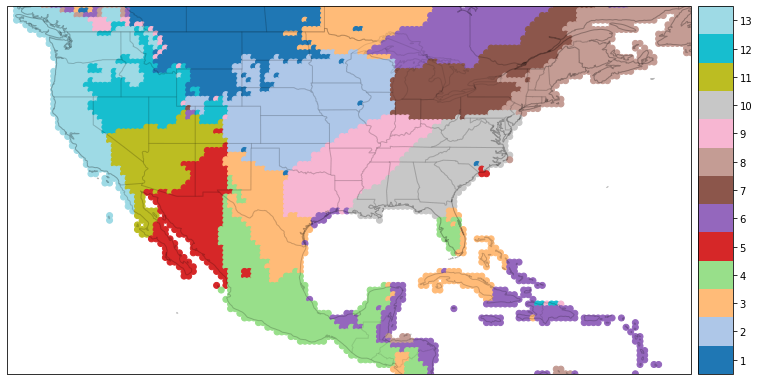

In [19]:
inspect(reverse, 13)

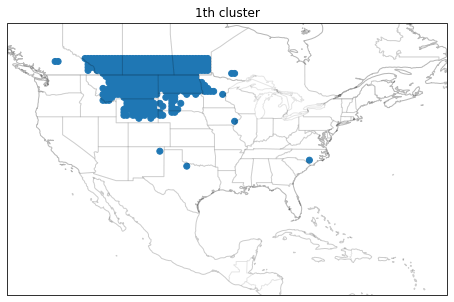

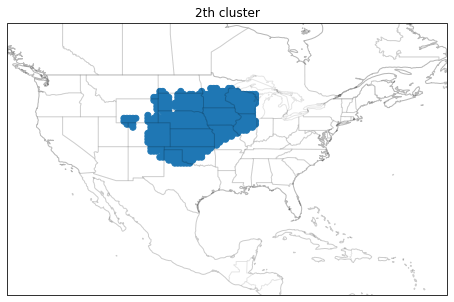

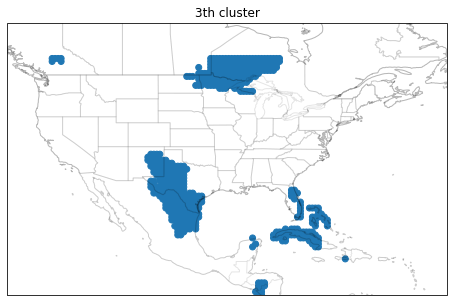

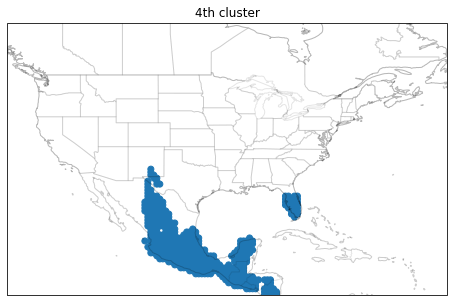

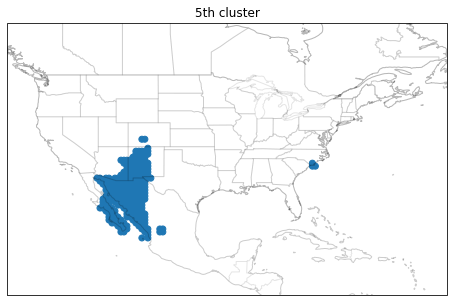

...

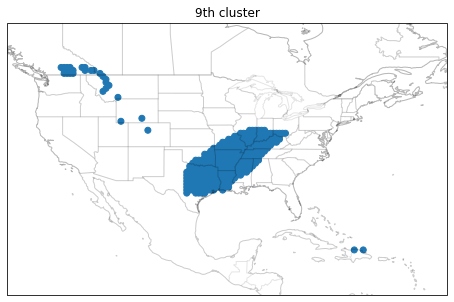

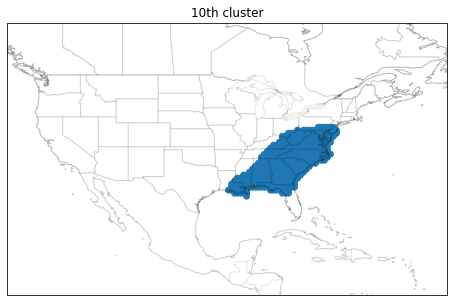

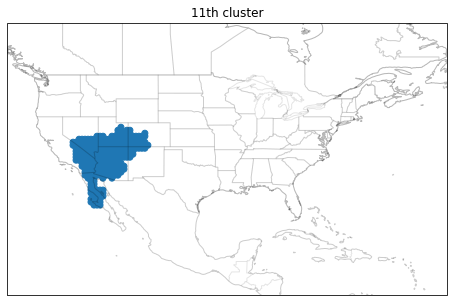

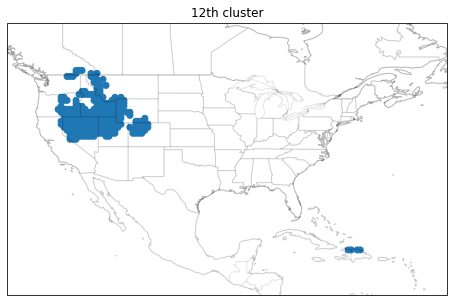

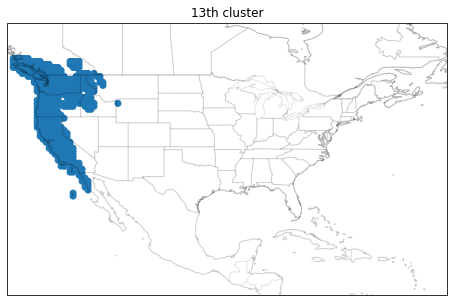

In [20]:
inspect_individual(reverse, 13)

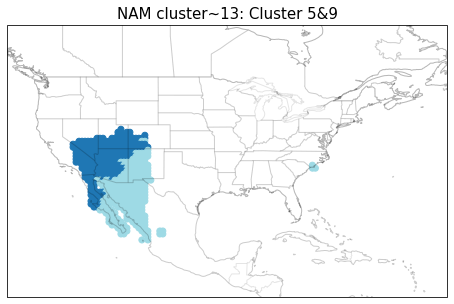

In [21]:
fig = plt.figure(figsize=(10,5))
ax = plt.subplot(111, projection=ccrs.PlateCarree(central_longitude=180))
ax.coastlines(alpha=0.2)
ax.add_feature(cartopy.feature.BORDERS, alpha=0.1)
ax.add_feature(cartopy.feature.STATES, alpha=0.1)
xx, yy = np.meshgrid(lon, lat)
temp = reverse.copy()
clusters=[5,9]
for i in range(len(temp)):
    if temp[i]!=5 and temp[i]!=11:
        temp[i]=-1
    if temp[i]==5:
        temp[i]=1
    if temp[i]==11:
        temp[i]=0
masked_temp = np.ma.array(temp, mask=temp<0)
palette = copy.copy(mpl.cm.get_cmap("tab20", 2))
palette.set_bad('b', 0)
scat = ax.scatter(xx, yy, c=masked_temp.reshape(80, 148), cmap=plt.cm.get_cmap('tab20', 2), 
                  transform=ccrs.PlateCarree())
ax.set_extent([230.74, 304.25, 12.25, 51.75])
plt.title('NAM cluster~13: Cluster 5&9', fontsize=15)
# plt.savefig('13C-NAM.png', bbox_inches = 'tight', pad_inches = 0)
plt.show()
nam_13 = temp.copy()

## 14 clusters

In [22]:
space = np.genfromtxt('space_global_14.txt', delimiter=',')
print(space.shape)
bmu = space[:,0]
print(np.unique(bmu, return_counts=True))

reverse = np.zeros(11840)
for i in range(11840):
    if i in nan_ind:
        reverse[i]=-1
    else:
        cindex = findindex(i, nan_ind)
        reverse[i]=bmu[cindex]
print(np.unique(reverse, return_counts=True))

(5955, 2)
(array([ 1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12., 13.,
       14.]), array([694, 196, 485, 555, 408, 290, 731, 394, 353, 397, 418, 301, 370,
       363]))
(array([-1.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12.,
       13., 14.]), array([5885,  694,  196,  485,  555,  408,  290,  731,  394,  353,  397,
        418,  301,  370,  363]))


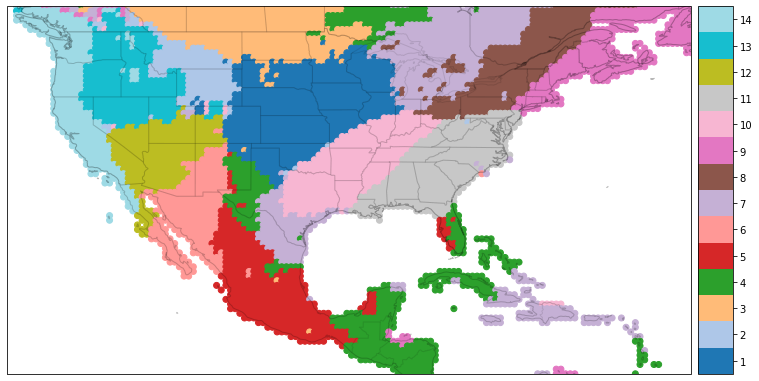

In [23]:
inspect(reverse, total=14)

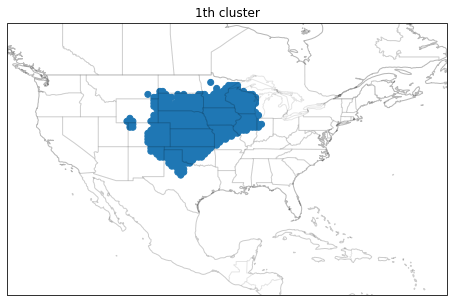

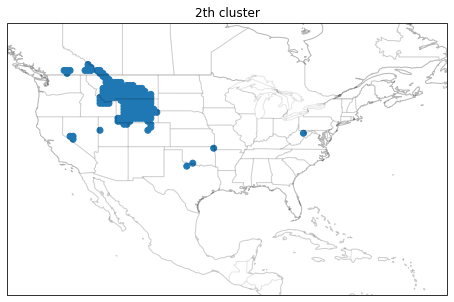

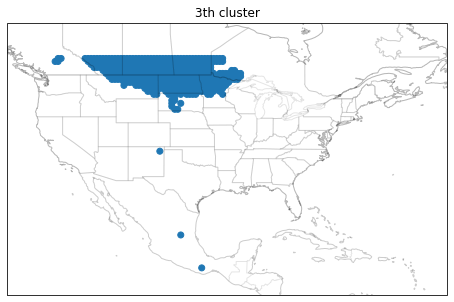

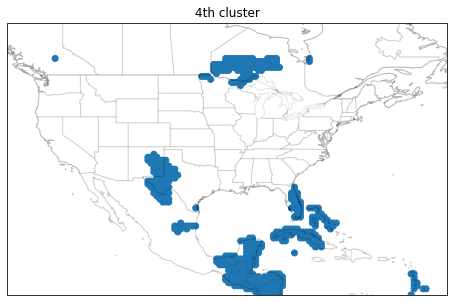

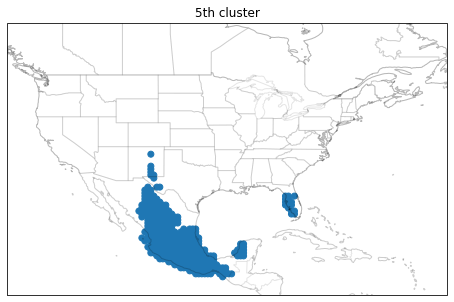

...

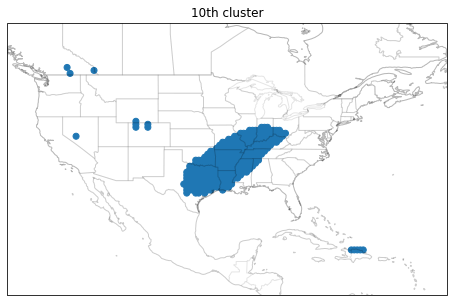

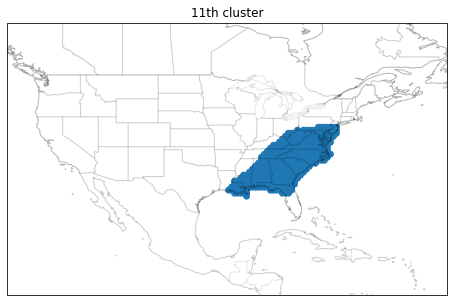

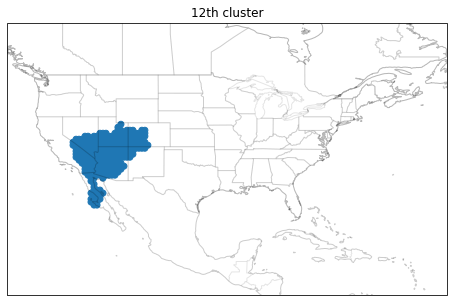

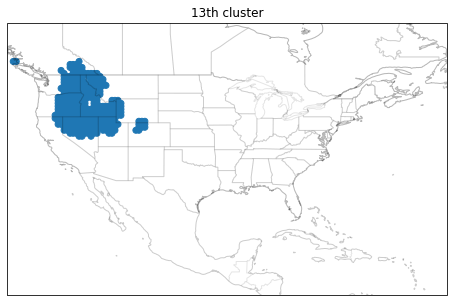

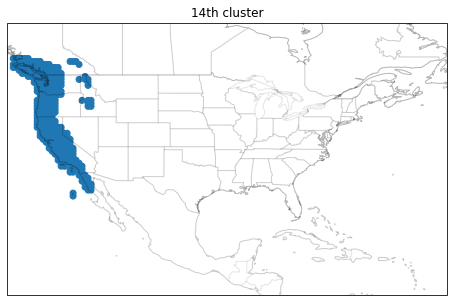

In [24]:
inspect_individual(reverse, 14)

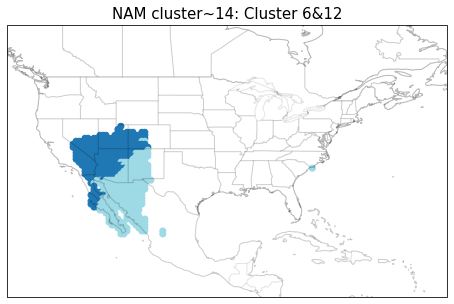

In [25]:
fig = plt.figure(figsize=(10,5))
ax = plt.subplot(111, projection=ccrs.PlateCarree(central_longitude=180))
ax.coastlines(alpha=0.2)
ax.add_feature(cartopy.feature.BORDERS, alpha=0.1)
ax.add_feature(cartopy.feature.STATES, alpha=0.1)
xx, yy = np.meshgrid(lon, lat)
temp = reverse.copy()
clusters=[5,9]
for i in range(len(temp)):
    if temp[i]!=6 and temp[i]!=12:
        temp[i]=-1
    if temp[i]==6:
        temp[i]=1
    if temp[i]==12:
        temp[i]=0
masked_temp = np.ma.array(temp, mask=temp<0)
palette = copy.copy(mpl.cm.get_cmap("tab20", 2))
palette.set_bad('b', 0)
scat = ax.scatter(xx, yy, c=masked_temp.reshape(80, 148), cmap=plt.cm.get_cmap('tab20', 2), 
                  transform=ccrs.PlateCarree())
ax.set_extent([230.74, 304.25, 12.25, 51.75])
plt.title('NAM cluster~14: Cluster 6&12', fontsize=15)
# plt.savefig('14C-NAM.png', bbox_inches = 'tight', pad_inches = 0)
plt.show()
nam_14 = temp.copy()

## 15 clusters

In [26]:
space = np.genfromtxt('space_global_15.txt', delimiter=',')
print(space.shape)
bmu = space[:,0]
print(np.unique(bmu, return_counts=True))

reverse = np.zeros(11840)
for i in range(11840):
    if i in nan_ind:
        reverse[i]=-1
    else:
        cindex = findindex(i, nan_ind)
        reverse[i]=bmu[cindex]
print(np.unique(reverse, return_counts=True))

(5955, 2)
(array([ 1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12., 13.,
       14., 15.]), array([653, 179, 430, 563, 439, 282, 403, 532, 374, 345, 343, 381, 299,
       372, 360]))
(array([-1.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12.,
       13., 14., 15.]), array([5885,  653,  179,  430,  563,  439,  282,  403,  532,  374,  345,
        343,  381,  299,  372,  360]))


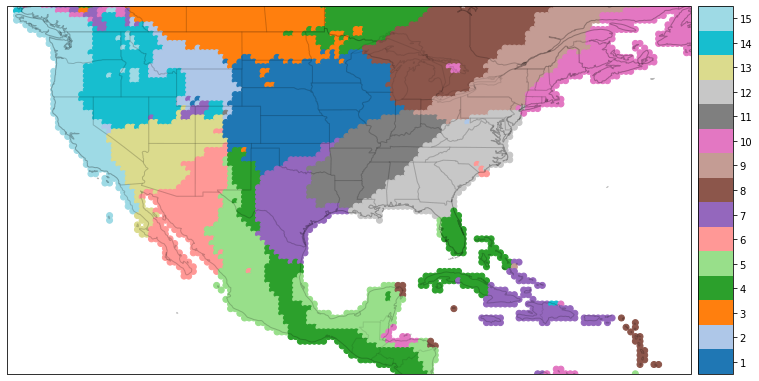

In [27]:
inspect(reverse, total=15)

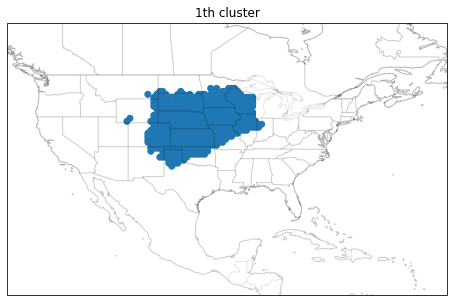

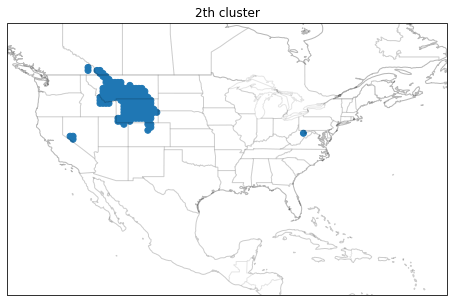

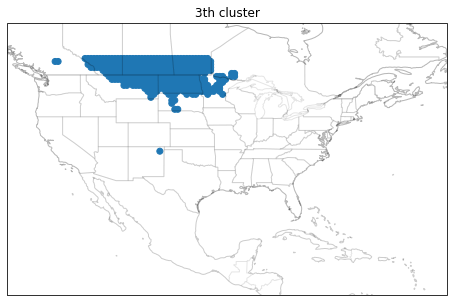

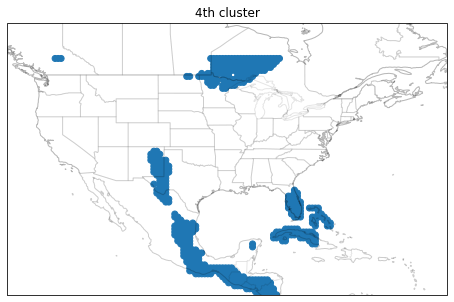

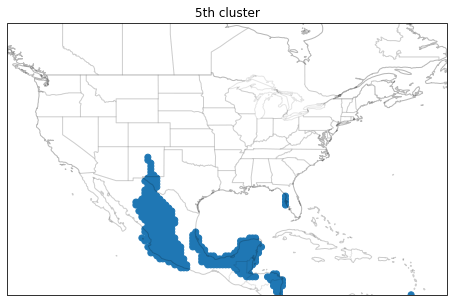

...

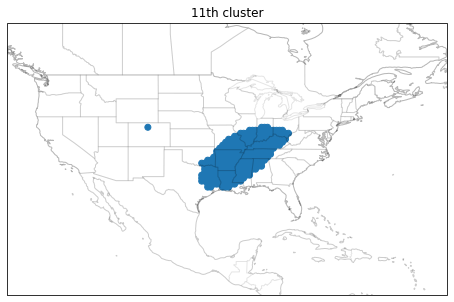

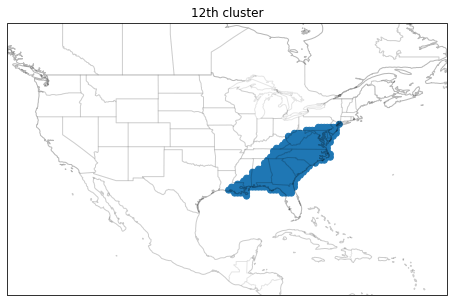

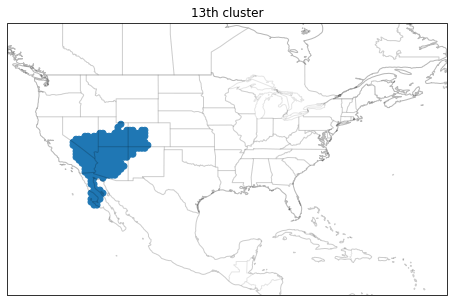

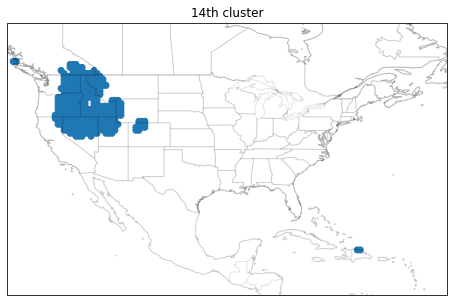

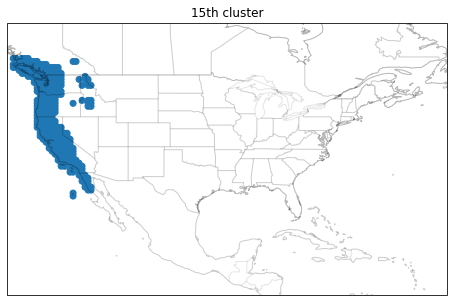

In [28]:
inspect_individual(reverse, 15)

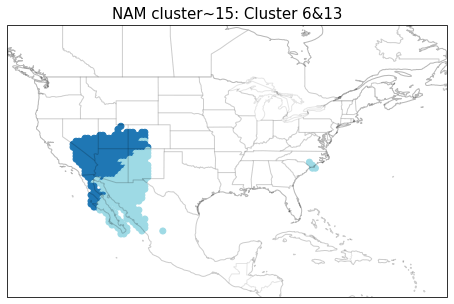

In [29]:
fig = plt.figure(figsize=(10,5))
ax = plt.subplot(111, projection=ccrs.PlateCarree(central_longitude=180))
ax.coastlines(alpha=0.2)
ax.add_feature(cartopy.feature.BORDERS, alpha=0.1)
ax.add_feature(cartopy.feature.STATES, alpha=0.1)
xx, yy = np.meshgrid(lon, lat)
temp = reverse.copy()
for i in range(len(temp)):
    if temp[i]!=6 and temp[i]!=13:
        temp[i]=-1
    if temp[i]==6:
        temp[i]=1
    if temp[i]==13:
        temp[i]=0
masked_temp = np.ma.array(temp, mask=temp<0)
palette = copy.copy(mpl.cm.get_cmap("tab20", 2))
palette.set_bad('b', 0)
scat = ax.scatter(xx, yy, c=masked_temp.reshape(80, 148), cmap=plt.cm.get_cmap('tab20', 2), 
                  transform=ccrs.PlateCarree())
ax.set_extent([230.74, 304.25, 12.25, 51.75])
plt.title('NAM cluster~15: Cluster 6&13', fontsize=15)
# plt.savefig('15C-NAM.png', bbox_inches = 'tight', pad_inches = 0)
plt.show()
nam_15 = temp.copy()

## 16 clusters

In [30]:
space = np.genfromtxt('space_global_16.txt', delimiter=',')
print(space.shape)
bmu = space[:,0]
print(np.unique(bmu, return_counts=True))
reverse = np.zeros(11840)
for i in range(11840):
    if i in nan_ind:
        reverse[i]=-1
    else:
        cindex = findindex(i, nan_ind)
        reverse[i]=bmu[cindex]
print(np.unique(reverse, return_counts=True))

(5955, 2)
(array([ 1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12., 13.,
       14., 15., 16.]), array([340, 571, 487, 326, 537, 276, 278, 378, 389, 370, 326, 305, 344,
       292, 376, 360]))
(array([-1.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12.,
       13., 14., 15., 16.]), array([5885,  340,  571,  487,  326,  537,  276,  278,  378,  389,  370,
        326,  305,  344,  292,  376,  360]))


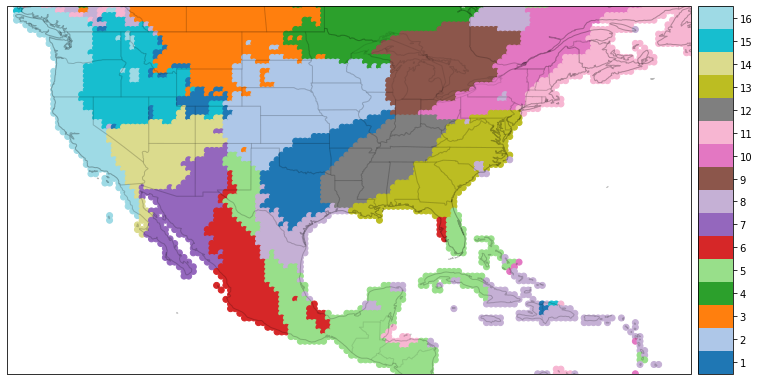

In [31]:
inspect(reverse, 16)

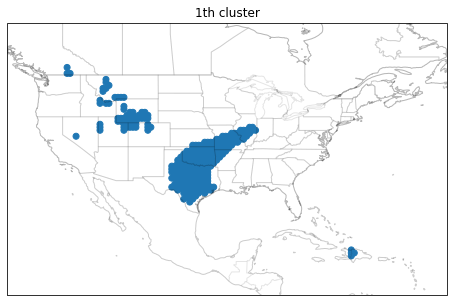

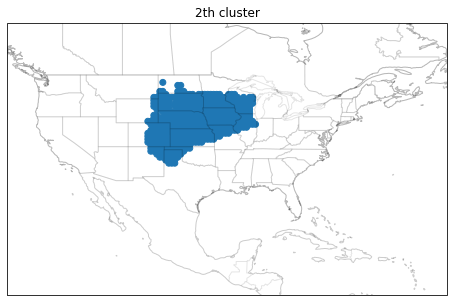

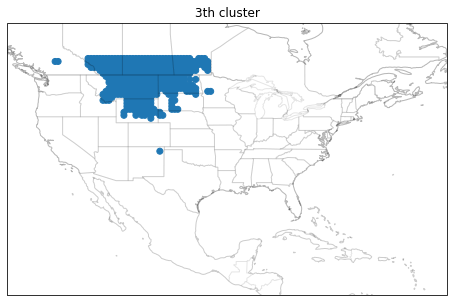

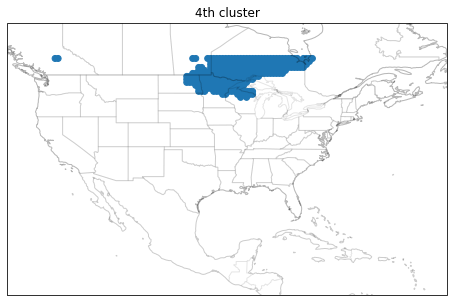

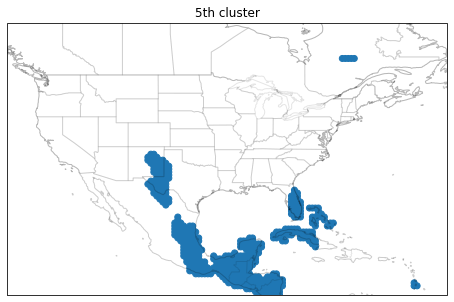

...

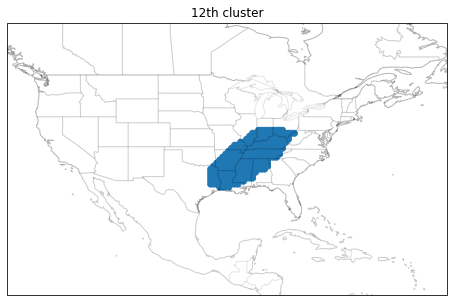

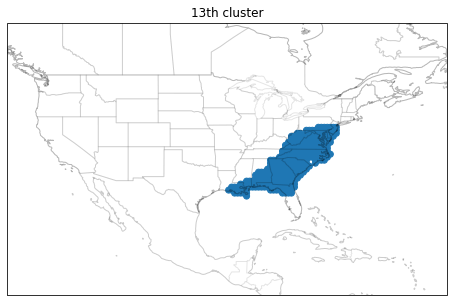

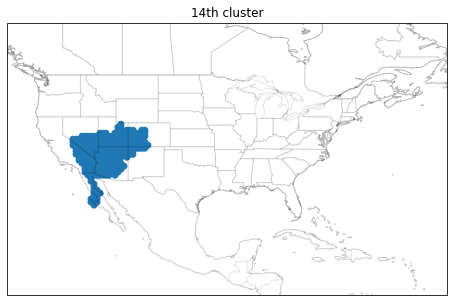

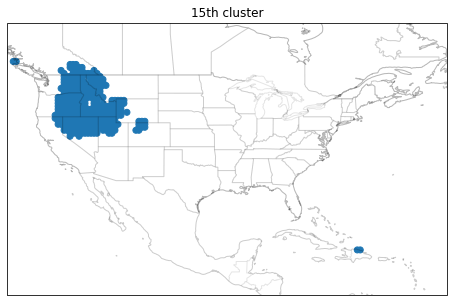

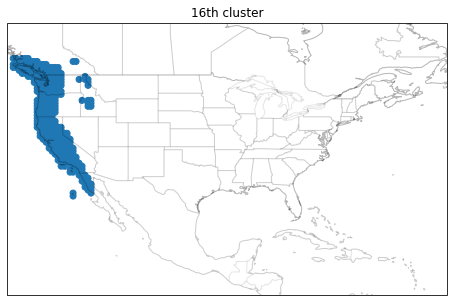

In [32]:
inspect_individual(reverse, 16)

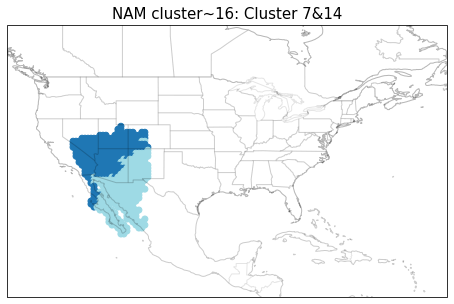

In [33]:
fig = plt.figure(figsize=(10,5))
ax = plt.subplot(111, projection=ccrs.PlateCarree(central_longitude=180))
ax.coastlines(alpha=0.2)
ax.add_feature(cartopy.feature.BORDERS, alpha=0.1)
ax.add_feature(cartopy.feature.STATES, alpha=0.1)
xx, yy = np.meshgrid(lon, lat)
temp = reverse.copy()
for i in range(len(temp)):
    if temp[i]!=7 and temp[i]!=14:
        temp[i]=-1
    if temp[i]==7:
        temp[i]=1
    if temp[i]==14:
        temp[i]=0
masked_temp = np.ma.array(temp, mask=temp<0)
palette = copy.copy(mpl.cm.get_cmap("tab20", 2))
palette.set_bad('b', 0)
scat = ax.scatter(xx, yy, c=masked_temp.reshape(80, 148), cmap=plt.cm.get_cmap('tab20', 2), 
                  transform=ccrs.PlateCarree())
ax.set_extent([230.74, 304.25, 12.25, 51.75])
plt.title('NAM cluster~16: Cluster 7&14', fontsize=15)
# plt.savefig('16C-NAM.png', bbox_inches = 'tight', pad_inches = 0)
plt.show()
nam_16 = temp.copy()

## 17 clusters

In [34]:
space = np.genfromtxt('space_global_17.txt', delimiter=',')
print(space.shape)
bmu = space[:,0]
print(np.unique(bmu, return_counts=True))
reverse = np.zeros(11840)
for i in range(11840):
    if i in nan_ind:
        reverse[i]=-1
    else:
        cindex = findindex(i, nan_ind)
        reverse[i]=bmu[cindex]
print(np.unique(reverse, return_counts=True))

(5955, 2)
(array([ 1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12., 13.,
       14., 15., 16., 17.]), array([317, 575, 469, 337, 417, 411, 289, 357, 394, 360, 319, 307, 345,
       244, 136, 315, 363]))
(array([-1.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12.,
       13., 14., 15., 16., 17.]), array([5885,  317,  575,  469,  337,  417,  411,  289,  357,  394,  360,
        319,  307,  345,  244,  136,  315,  363]))


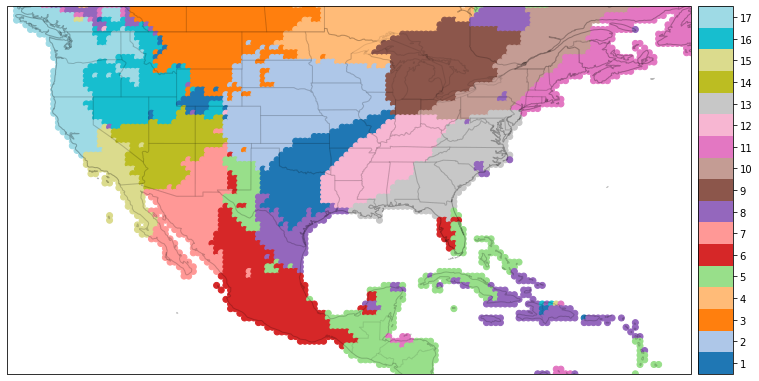

In [35]:
inspect(reverse, 17)

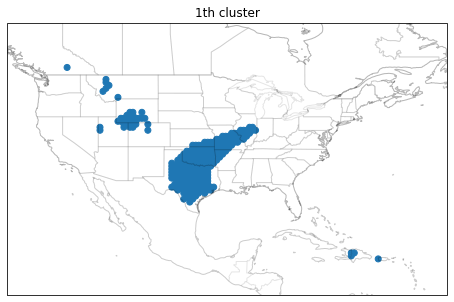

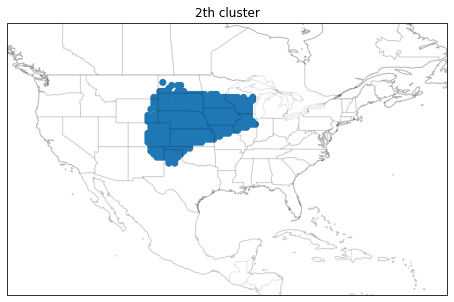

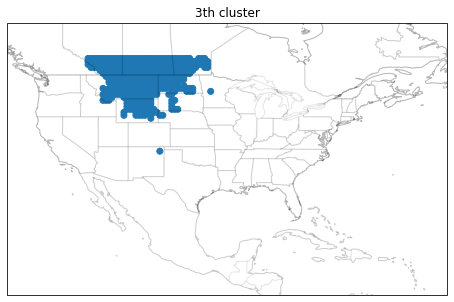

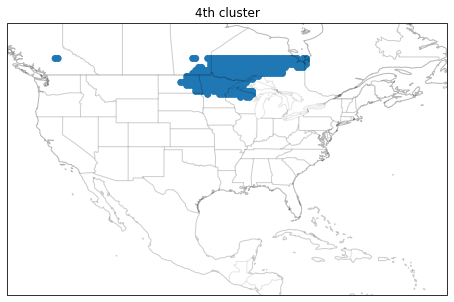

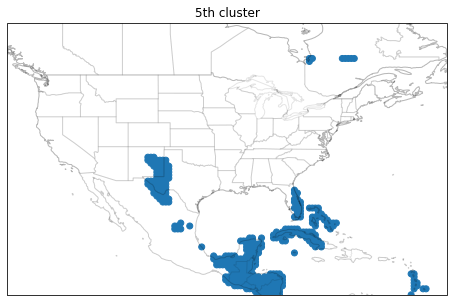

...

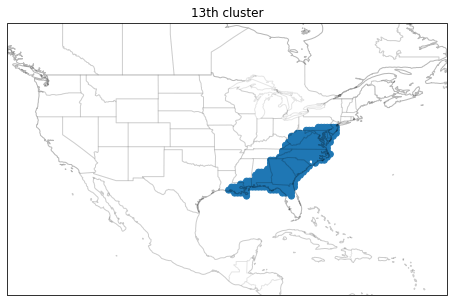

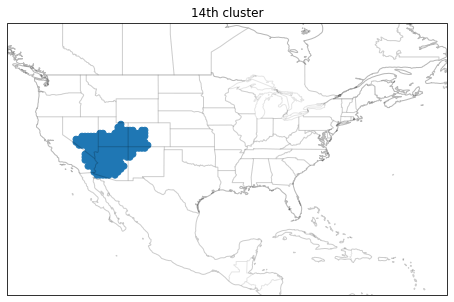

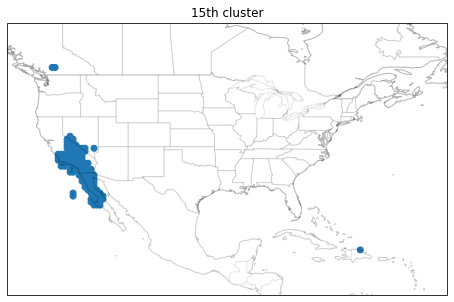

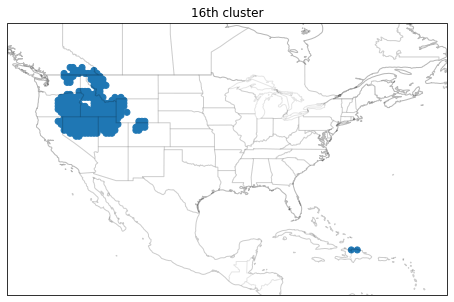

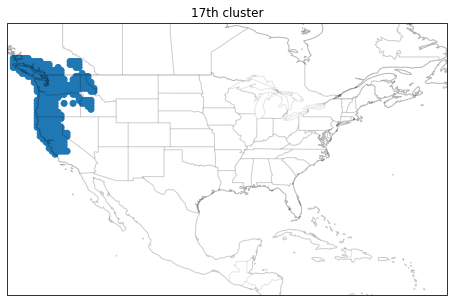

In [36]:
inspect_individual(reverse, 17)

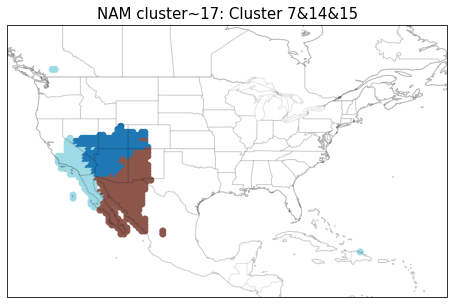

In [37]:
fig = plt.figure(figsize=(10,5))
ax = plt.subplot(111, projection=ccrs.PlateCarree(central_longitude=180))
ax.coastlines(alpha=0.2)
ax.add_feature(cartopy.feature.BORDERS, alpha=0.1)
ax.add_feature(cartopy.feature.STATES, alpha=0.1)
xx, yy = np.meshgrid(lon, lat)
temp = reverse.copy()
for i in range(len(temp)):
    if temp[i]!=7 and temp[i]!=14 and temp[i]!=15:
        temp[i]=-1
    if temp[i]==7:
        temp[i]=1
    if temp[i] ==14:
        temp[i]=0
    if temp[i]==15:
        temp[i]=2
masked_temp = np.ma.array(temp, mask=temp<0)
palette = copy.copy(mpl.cm.get_cmap("tab20", 3))
palette.set_bad('b', 0)
scat = ax.scatter(xx, yy, c=masked_temp.reshape(80, 148), cmap=plt.cm.get_cmap('tab20', 3), 
                  transform=ccrs.PlateCarree())
ax.set_extent([230.74, 304.25, 12.25, 51.75])
plt.title('NAM cluster~17: Cluster 7&14&15', fontsize=15)
# plt.savefig('17C-NAM.png', bbox_inches = 'tight', pad_inches = 0)
plt.show()
nam_17 = temp.copy()

## 18 clusters

In [38]:
space = np.genfromtxt('space_global_18.txt', delimiter=',')
print(space.shape)
bmu = space[:,0]
print(np.unique(bmu, return_counts=True))
reverse = np.zeros(11840)
for i in range(11840):
    if i in nan_ind:
        reverse[i]=-1
    else:
        cindex = findindex(i, nan_ind)
        reverse[i]=bmu[cindex]
print(np.unique(reverse, return_counts=True))

(5955, 2)
(array([ 1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12., 13.,
       14., 15., 16., 17., 18.]), array([297, 426, 410, 369, 400, 361, 286, 416, 244, 382, 251, 410, 314,
       347, 246, 135, 338, 323]))
(array([-1.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12.,
       13., 14., 15., 16., 17., 18.]), array([5885,  297,  426,  410,  369,  400,  361,  286,  416,  244,  382,
        251,  410,  314,  347,  246,  135,  338,  323]))


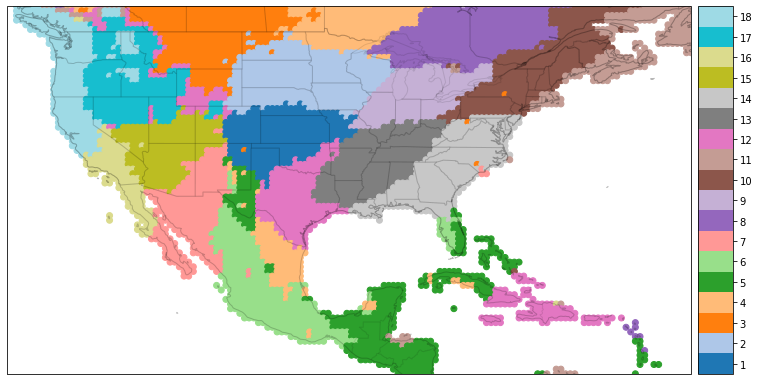

In [39]:
inspect(reverse, 18)

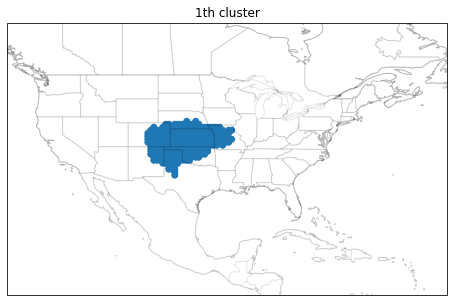

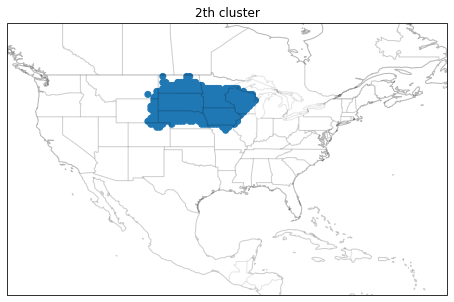

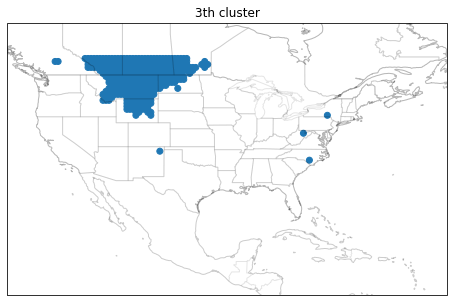

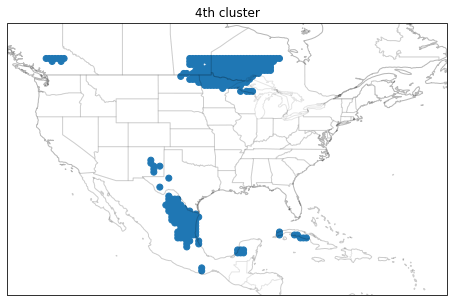

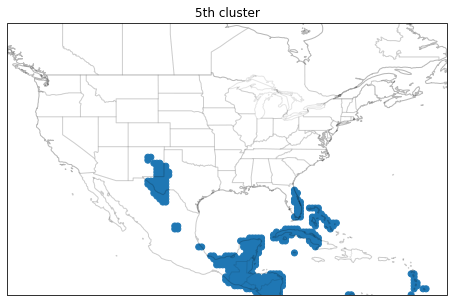

...

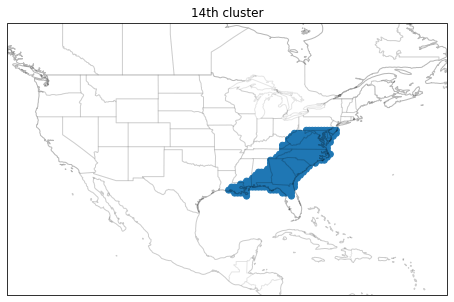

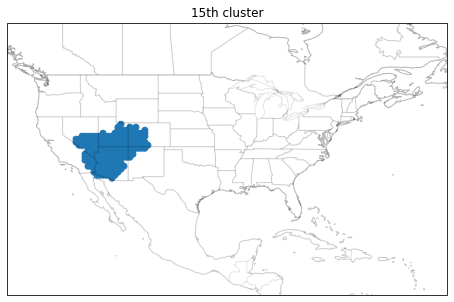

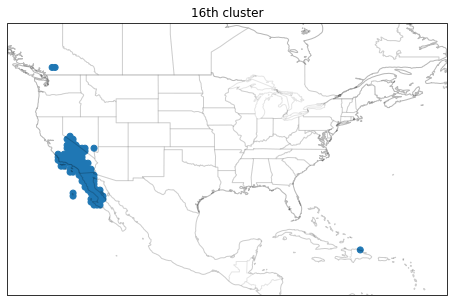

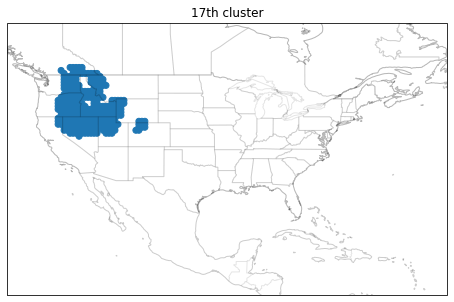

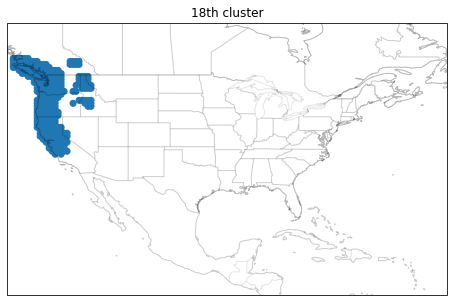

In [40]:
inspect_individual(reverse, 18)

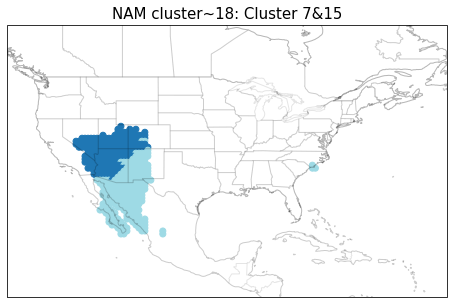

In [41]:
fig = plt.figure(figsize=(10,5))
ax = plt.subplot(111, projection=ccrs.PlateCarree(central_longitude=180))
ax.coastlines(alpha=0.2)
ax.add_feature(cartopy.feature.BORDERS, alpha=0.1)
ax.add_feature(cartopy.feature.STATES, alpha=0.1)
xx, yy = np.meshgrid(lon, lat)
temp = reverse.copy()
for i in range(len(temp)):
    if temp[i]!=7 and temp[i]!=15:
        temp[i]=-1
    if temp[i]==7:
        temp[i]=1
    if temp[i]==15:
        temp[i]=0
masked_temp = np.ma.array(temp, mask=temp<0)
palette = copy.copy(mpl.cm.get_cmap("tab20", 2))
palette.set_bad('b', 0)
scat = ax.scatter(xx, yy, c=masked_temp.reshape(80, 148), cmap=plt.cm.get_cmap('tab20', 2), 
                  transform=ccrs.PlateCarree())
ax.set_extent([230.74, 304.25, 12.25, 51.75])
plt.title('NAM cluster~18: Cluster 7&15', fontsize=15)
# plt.savefig('18C-NAM.png', bbox_inches = 'tight', pad_inches = 0)
plt.show()
nam_18 = temp.copy()

## 19 clusters

In [42]:
space = np.genfromtxt('space_global_19.txt', delimiter=',')
print(space.shape)
bmu = space[:,0]
print(np.unique(bmu, return_counts=True))
reverse = np.zeros(11840)
for i in range(11840):
    if i in nan_ind:
        reverse[i]=-1
    else:
        cindex = findindex(i, nan_ind)
        reverse[i]=bmu[cindex]
print(np.unique(reverse, return_counts=True))

(5955, 2)
(array([ 1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12., 13.,
       14., 15., 16., 17., 18., 19.]), array([298, 384, 179, 437, 505, 313, 237, 273, 313, 331, 374, 278, 328,
       328, 340, 245, 134, 334, 324]))
(array([-1.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12.,
       13., 14., 15., 16., 17., 18., 19.]), array([5885,  298,  384,  179,  437,  505,  313,  237,  273,  313,  331,
        374,  278,  328,  328,  340,  245,  134,  334,  324]))


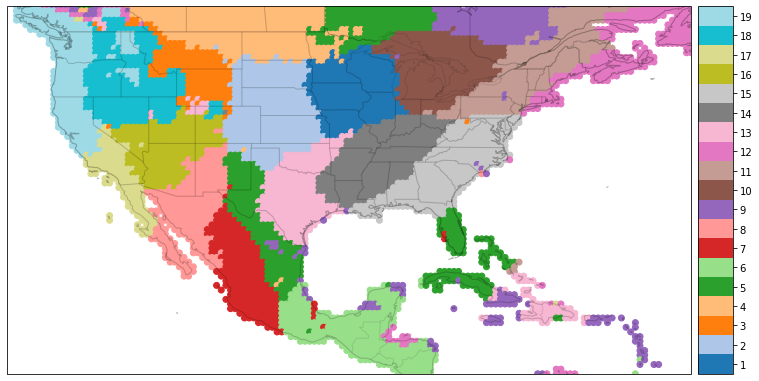

In [43]:
inspect(reverse, 19)

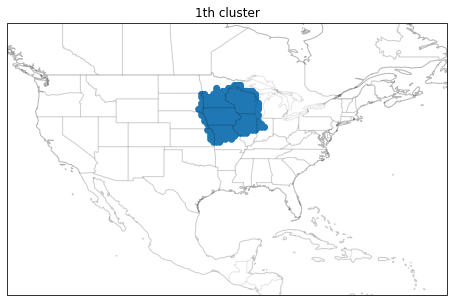

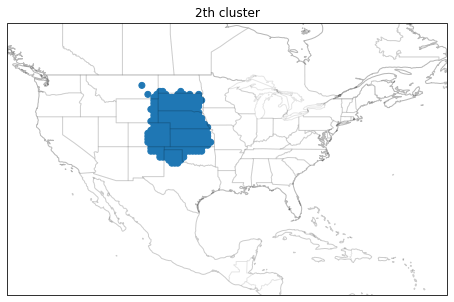

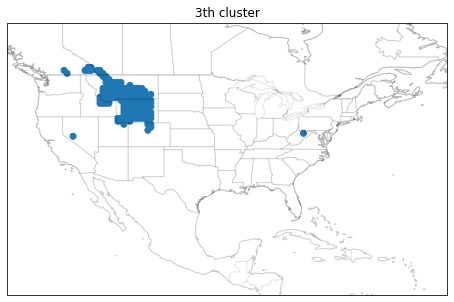

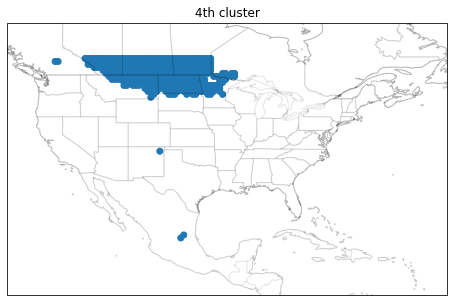

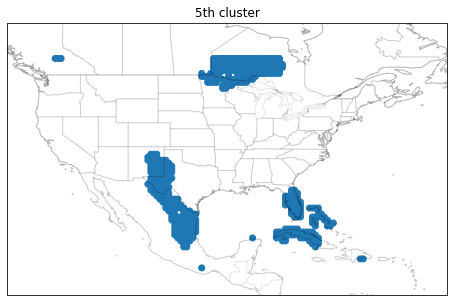

...

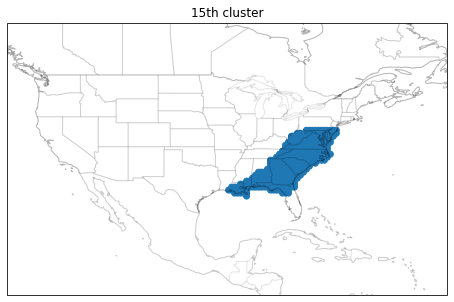

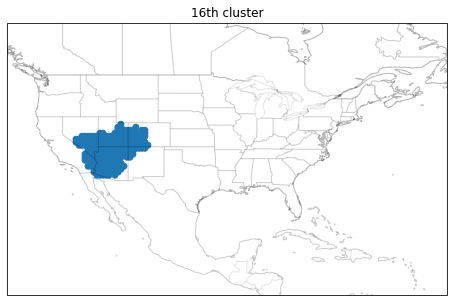

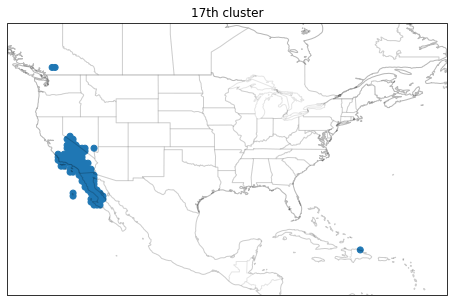

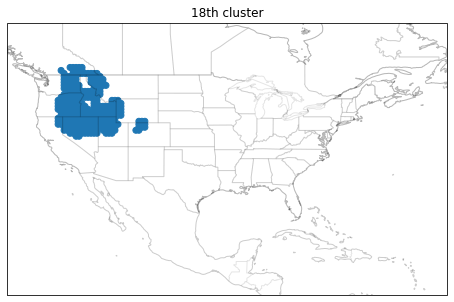

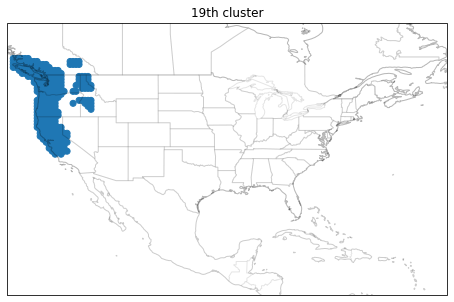

In [44]:
inspect_individual(reverse, 19)

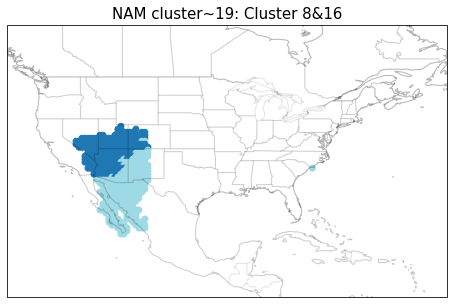

In [45]:
fig = plt.figure(figsize=(10,5))
ax = plt.subplot(111, projection=ccrs.PlateCarree(central_longitude=180))
ax.coastlines(alpha=0.2)
ax.add_feature(cartopy.feature.BORDERS, alpha=0.1)
ax.add_feature(cartopy.feature.STATES, alpha=0.1)
xx, yy = np.meshgrid(lon, lat)
temp = reverse.copy()
clusters=[5,9]
for i in range(len(temp)):
    if temp[i]!=8 and temp[i]!=16:
        temp[i]=-1
    if temp[i]==8:
        temp[i]=1
    if temp[i]==16:
        temp[i]=0
masked_temp = np.ma.array(temp, mask=temp<0)
palette = copy.copy(mpl.cm.get_cmap("tab20", 2))
palette.set_bad('b', 0)
scat = ax.scatter(xx, yy, c=masked_temp.reshape(80, 148), cmap=plt.cm.get_cmap('tab20', 2), 
                  transform=ccrs.PlateCarree())
ax.set_extent([230.74, 304.25, 12.25, 51.75])
plt.title('NAM cluster~19: Cluster 8&16', fontsize=15)
# plt.savefig('19C-NAM.png', bbox_inches = 'tight', pad_inches = 0)
plt.show()
nam_19 = temp.copy()

## 20 clusters

In [46]:
space = np.genfromtxt('space_global_20.txt', delimiter=',')
print(space.shape)
bmu = space[:,0]
print(np.unique(bmu, return_counts=True))
reverse = np.zeros(11840)
for i in range(11840):
    if i in nan_ind:
        reverse[i]=-1
    else:
        cindex = findindex(i, nan_ind)
        reverse[i]=bmu[cindex]
print(np.unique(reverse, return_counts=True))

(5955, 2)
(array([ 1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12., 13.,
       14., 15., 16., 17., 18., 19., 20.]), array([380, 302, 171, 410, 603, 167, 256, 276, 408, 212, 371, 248, 346,
       226, 230, 309, 247, 134, 331, 328]))
(array([-1.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12.,
       13., 14., 15., 16., 17., 18., 19., 20.]), array([5885,  380,  302,  171,  410,  603,  167,  256,  276,  408,  212,
        371,  248,  346,  226,  230,  309,  247,  134,  331,  328]))


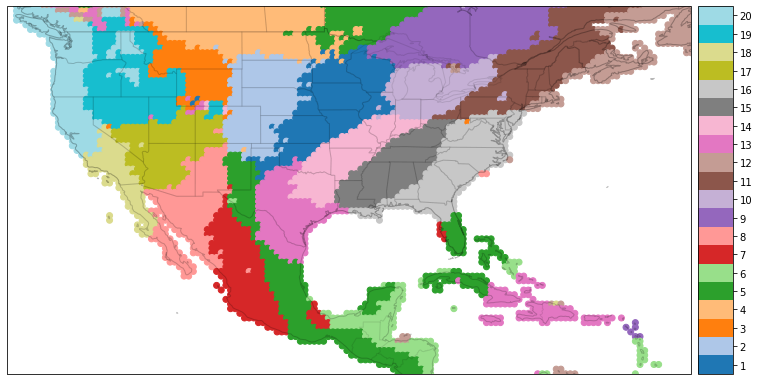

In [47]:
inspect(reverse, 20)

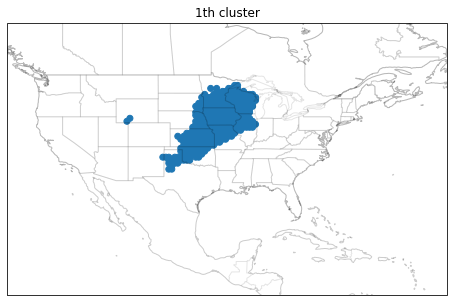

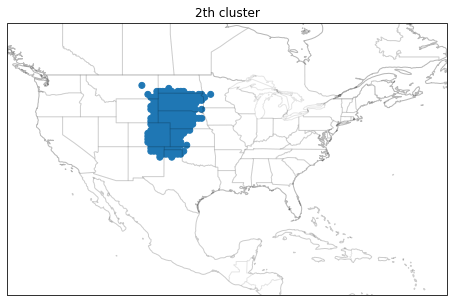

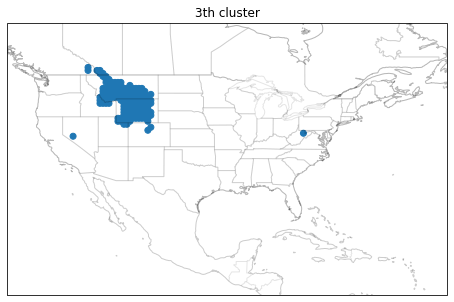

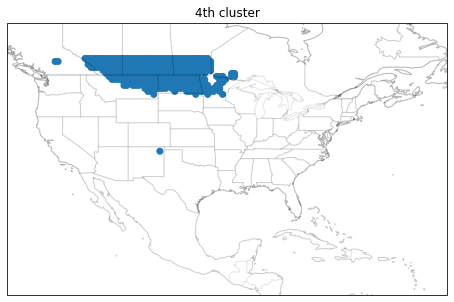

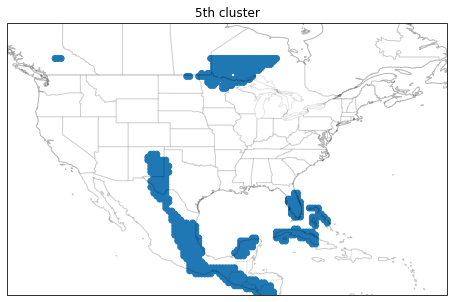

...

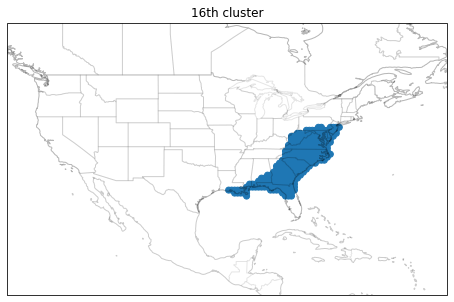

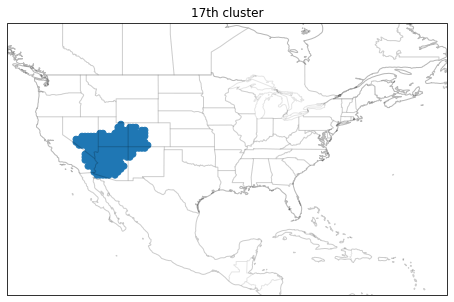

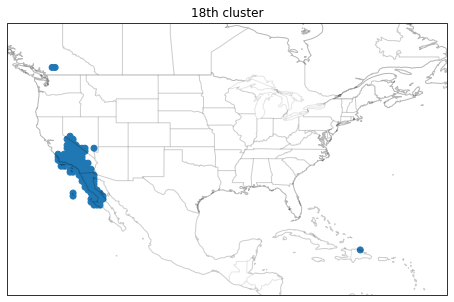

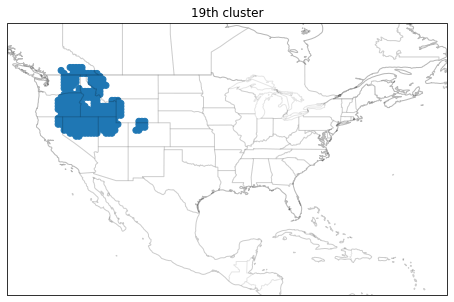

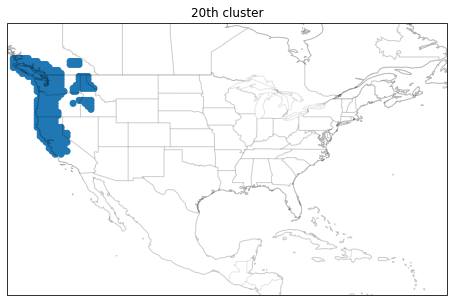

In [48]:
inspect_individual(reverse, 20)

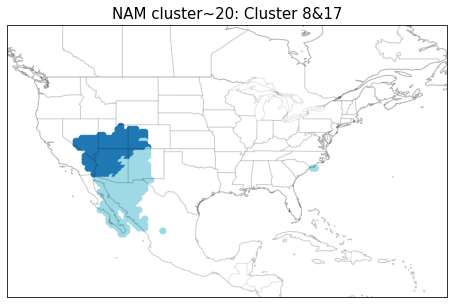

In [49]:
fig = plt.figure(figsize=(10,5))
ax = plt.subplot(111, projection=ccrs.PlateCarree(central_longitude=180))
ax.coastlines(alpha=0.2)
ax.add_feature(cartopy.feature.BORDERS, alpha=0.1)
ax.add_feature(cartopy.feature.STATES, alpha=0.1)
xx, yy = np.meshgrid(lon, lat)
temp = reverse.copy()

for i in range(len(temp)):
    if temp[i]!=8 and temp[i]!=17:
        temp[i]=-1
    if temp[i]==8:
        temp[i]=1
    if temp[i]==17:
        temp[i]=0
masked_temp = np.ma.array(temp, mask=temp<0)
palette = copy.copy(mpl.cm.get_cmap("tab20", 2))
palette.set_bad('b', 0)
scat = ax.scatter(xx, yy, c=masked_temp.reshape(80, 148), cmap=plt.cm.get_cmap('tab20', 2), 
                  transform=ccrs.PlateCarree())
ax.set_extent([230.74, 304.25, 12.25, 51.75])
plt.title('NAM cluster~20: Cluster 8&17', fontsize=15)
# plt.savefig('20C-NAM.png', bbox_inches = 'tight', pad_inches = 0)
plt.show()
nam_20 = temp.copy()

## NAM common

In [50]:
print(nam_10.shape, ' ', nam_11.shape)
sep_10 = nam_10.copy()
sep_11 = nam_11.copy()
sep_12 = nam_12.copy()
sep_13 = nam_13.copy()
sep_14 = nam_14.copy()
sep_15 = nam_15.copy()
sep_16 = nam_16.copy()
sep_17 = nam_17.copy()
sep_18 = nam_18.copy()
sep_19 = nam_19.copy()
sep_20 = nam_20.copy()

nam_10[nam_10!=-1]=1
nam_11[nam_11!=-1]=1
nam_12[nam_12!=-1]=1
nam_13[nam_13!=-1]=1
nam_14[nam_14!=-1]=1
nam_15[nam_15!=-1]=1
nam_16[nam_16!=-1]=1
nam_17[nam_17!=-1]=1
nam_18[nam_18!=-1]=1
nam_19[nam_19!=-1]=1
nam_20[nam_20!=-1]=1

nam = nam_10+nam_11+nam_12+nam_13+nam_14+nam_15+nam_16+nam_17+nam_18+nam_19+nam_20
print(np.unique(nam, return_counts=True))

(11840,)   (11840,)
(array([-11.,  -9.,  -7.,  -5.,  -3.,  -1.,   1.,   3.,   5.,   7.,   9.,
        11.]), array([10922,   283,     9,    23,     6,     4,     5,    27,    50,
          21,     4,   486]))


In [51]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature

(148,)   (80,)


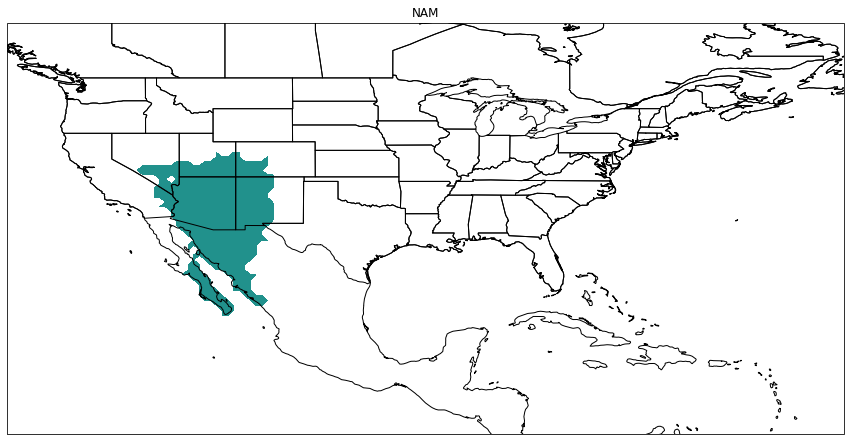

In [52]:
fig = plt.figure(figsize=(15, 15))
ax = plt.subplot(projection=ccrs.LambertCylindrical())
plt.title(f"NAM")
print(lon.shape, ' ', lat.shape)
x, y = np.meshgrid(lon, lat)
# Plot the data
masked_nam= np.ma.array(nam, mask=nam<10)
tplot = ax.contourf(x, y, masked_nam.reshape(80, 148), transform=ccrs.PlateCarree())
# pplot = ax.contour(lon ,lat, pres, colors='k')

# Cartopy and pyplot colorbars don't play that nice, 
# this code manually sets the colorbar axis 
# posn = ax.get_position()
# cbar_ax = fig.add_axes([posn.x0 + posn.width + 0.01, posn.y0, 0.02, posn.height])

# plt.colorbar(tplot, cax=cbar_ax, label='Temperature [K]')
# plt.clabel(pplot, fmt="%.0f")
ax.set_extent((230.75, 304.75, 11.75, 51.75))

ax.add_feature(cfeature.COASTLINE.with_scale('50m'))
ax.add_feature(cfeature.STATES.with_scale('50m'))
plt.show()

In [53]:
# np.save('nam', nam)

## Clean up

In [54]:
## fill the blank
struct_nam = nam.copy()
struct_nam = struct_nam.reshape(80,148)
struct_nam[struct_nam<10]=-1
flag=0
for i in range(1, 79):
    for j in range(1, 147):
        if struct_nam[i,j]==-1:
            if (struct_nam[i-1,j]!=-1)and(struct_nam[i+1,j]!=-1)and(struct_nam[i,j+1]!=-1)and(struct_nam[i,j-1]!=-1):
                struct_nam[i,j]=11
                print('blank')
                flag=1
    if flag==1:
        break
print(np.unique(struct_nam, return_counts=True))

blank
(array([-1., 11.]), array([11353,   487]))


(148,)   (80,)


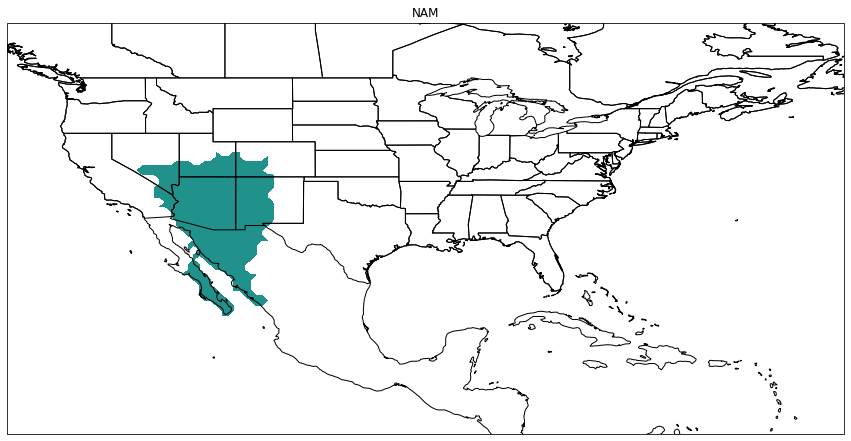

In [55]:
fig = plt.figure(figsize=(15, 15))
ax = plt.subplot(projection=ccrs.LambertCylindrical())
plt.title(f"NAM")
print(lon.shape, ' ', lat.shape)
x, y = np.meshgrid(lon, lat)
# Plot the data
masked_nam= np.ma.array(struct_nam, mask=struct_nam<10)
tplot = ax.contourf(x, y, masked_nam.reshape(80, 148), transform=ccrs.PlateCarree())
# pplot = ax.contour(lon ,lat, pres, colors='k')

# Cartopy and pyplot colorbars don't play that nice, 
# this code manually sets the colorbar axis 
# posn = ax.get_position()
# cbar_ax = fig.add_axes([posn.x0 + posn.width + 0.01, posn.y0, 0.02, posn.height])

# plt.colorbar(tplot, cax=cbar_ax, label='Temperature [K]')
# plt.clabel(pplot, fmt="%.0f")
ax.set_extent((230.75, 304.75, 11.75, 51.75))
states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
ax.add_feature(cfeature.COASTLINE.with_scale('50m'))
ax.add_feature(cfeature.STATES.with_scale('50m'))
# ax.add_feature(states_provinces)
plt.show()

(148,)   (80,)


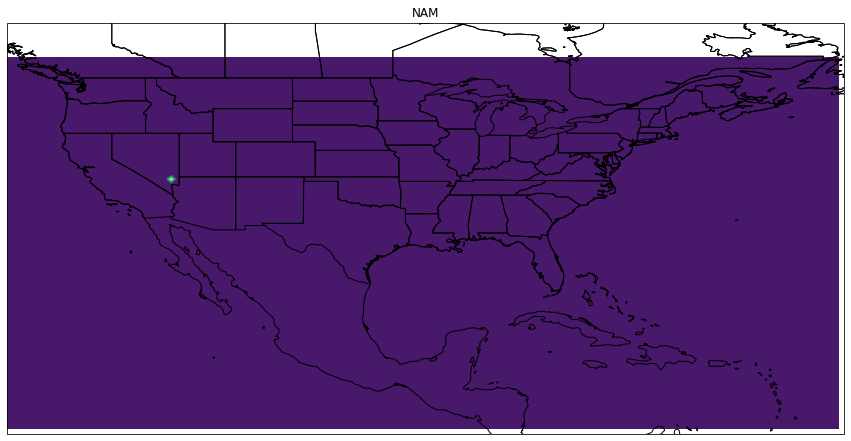

In [56]:
fig = plt.figure(figsize=(15, 15))
ax = plt.subplot(projection=ccrs.LambertCylindrical())
plt.title(f"NAM")
print(lon.shape, ' ', lat.shape)
x, y = np.meshgrid(lon, lat)
# Plot the data
origin_nam = nam.copy()
origin_nam = origin_nam.reshape(80,148)
origin_nam[origin_nam<10]=-1
diff = struct_nam-origin_nam
# masked_nam= np.ma.array(struct_nam, mask=struct_nam<10)
tplot = ax.contourf(x, y, diff.reshape(80, 148), transform=ccrs.PlateCarree())
# pplot = ax.contour(lon ,lat, pres, colors='k')

# Cartopy and pyplot colorbars don't play that nice, 
# this code manually sets the colorbar axis 
# posn = ax.get_position()
# cbar_ax = fig.add_axes([posn.x0 + posn.width + 0.01, posn.y0, 0.02, posn.height])

# plt.colorbar(tplot, cax=cbar_ax, label='Temperature [K]')
# plt.clabel(pplot, fmt="%.0f")
ax.set_extent((230.75, 304.75, 11.75, 51.75))

ax.add_feature(cfeature.COASTLINE.with_scale('50m'))
ax.add_feature(cfeature.STATES.with_scale('50m'))
plt.show()

In [57]:
# np.save('nam', struct_nam)

## NAM subplots

[-1.  0.  1.]


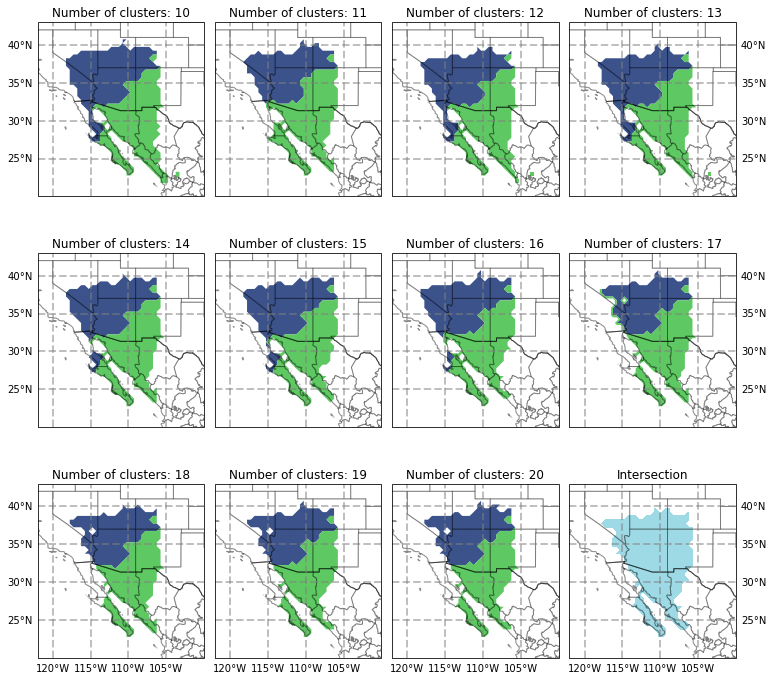

In [58]:
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import matplotlib.ticker as mticker

sep_nams = [sep_10, sep_11, sep_12, sep_13, sep_14, sep_15, sep_16, sep_17, sep_18, sep_19, sep_20, struct_nam]
print(np.unique(sep_10))
figure, axes = plt.subplots(3,4, figsize=(10,10), subplot_kw={'projection': ccrs.PlateCarree()})
for i, sep in enumerate(sep_nams):
    ax = axes.flatten()[i]
    ax.coastlines(alpha=0.2)
    ax.add_feature(cfeature.STATES.with_scale('10m'), alpha=0.3)
    ax.add_feature(cartopy.feature.BORDERS, alpha=0.5)
    # ax.add_feature(cartopy.feature.STATES, alpha=0.3)
    masked_temp = np.ma.array(sep, mask=sep<0)
    palette = copy.copy(mpl.cm.get_cmap("tab20", 2))
    palette.set_bad('b', 0)
    if i<11:
        scat = ax.contourf(xx, yy, masked_temp.reshape(80, 148), antialiased=True, 
                      transform=ccrs.PlateCarree(), levels=[-1, 0, 1])
    else:
        scat = ax.contourf(xx, yy, masked_temp.reshape(80, 148), cmap=plt.cm.get_cmap('tab20', 2), 
                      transform=ccrs.PlateCarree(), levels=[-1, 0, 12])
    ax.set_extent([238, 260, 20, 43], crs=ccrs.PlateCarree())
    gl = ax.gridlines(crs=cartopy.crs.PlateCarree(), draw_labels=True, linewidth=2, color='gray', alpha=0.5, linestyle='--')
    gl.xlocator = mticker.FixedLocator([-105, -110, -115, -120])
    gl.ylocator = mticker.FixedLocator([25, 30, 35, 40])
    if i not in [0, 4, 8]:
        gl.left_labels = False
    if i not in [8, 9, 10, 11]:
        gl.bottom_labels = False
    if i not in [3, 7, 11]:
        gl.right_labels=False
    gl.top_labels = False
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
    if i<11:
        ax.set_title('Number of clusters: '+str(i+10), fontsize=12)
    else:
        ax.set_title('Intersection', fontsize=12)
plt.tight_layout()
plt.savefig('NAM-ensemble.png', dpi=120, bbox_inches='tight')
plt.show()

In [59]:
print(np.unique(sep_17))
print(plt.rcParams['lines.markersize'])

[-1.  0.  1.  2.]
6.0


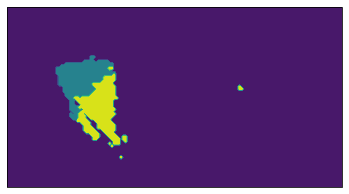

In [60]:
figure = plt.figure()
ax = figure.add_subplot(projection=cartopy.crs.PlateCarree())
ax.contourf(xx, yy, sep_10.reshape(80, 148))

## Separate NAM

### NAM0

In [61]:
sep_10_0 = sep_10.copy()
sep_11_0 = sep_11.copy()
sep_12_0 = sep_12.copy()
sep_13_0 = sep_13.copy()
sep_14_0 = sep_14.copy()
sep_15_0 = sep_15.copy()
sep_16_0 = sep_16.copy()
sep_17_0 = sep_17.copy()
sep_18_0 = sep_18.copy()
sep_19_0 = sep_19.copy()
sep_20_0 = sep_20.copy()

sep_10_0[sep_10!=0]=-1
sep_11_0[sep_11!=0]=-1
sep_12_0[sep_12!=0]=-1
sep_13_0[sep_13!=0]=-1
sep_14_0[sep_14!=0]=-1
sep_15_0[sep_15!=0]=-1
sep_16_0[sep_16!=0]=-1
sep_17_0[sep_17!=0]=-1
sep_18_0[sep_18!=0]=-1
sep_19_0[sep_19!=0]=-1
sep_20_0[sep_20!=0]=-1
nam_0 = sep_10_0+sep_11_0+sep_12_0+sep_13_0+sep_14_0+sep_15_0+sep_16_0+sep_17_0+sep_18_0+sep_19_0+sep_20_0
print(np.unique(nam_0, return_counts=True))

(array([-11., -10.,  -9.,  -8.,  -7.,  -6.,  -5.,  -4.,  -3.,  -2.,  -1.,
         0.]), array([11321,   192,     8,    14,     1,    11,    29,    26,     2,
          17,     8,   211]))


In [62]:
## fill the blank
struct_nam_0 = nam_0.copy()
struct_nam_0 = struct_nam_0.reshape(80,148)
struct_nam_0[struct_nam_0<0]=-1
flag=0
for i in range(1, 79):
    for j in range(1, 147):
        if struct_nam_0[i,j]==-1:
            if (struct_nam_0[i-1,j]!=-1)and(struct_nam_0[i+1,j]!=-1)and(struct_nam_0[i,j+1]!=-1)and(struct_nam_0[i,j-1]!=-1):
                struct_nam_0[i,j]=0
                print('blank')
                flag=1
    if flag==1:
        break
print(np.unique(struct_nam_0, return_counts=True))

blank
(array([-1.,  0.]), array([11628,   212]))


In [63]:
sep_10_1 = sep_10.copy()
sep_11_1 = sep_11.copy()
sep_12_1 = sep_12.copy()
sep_13_1 = sep_13.copy()
sep_14_1 = sep_14.copy()
sep_15_1 = sep_15.copy()
sep_16_1 = sep_16.copy()
sep_17_1 = sep_17.copy()
sep_18_1 = sep_18.copy()
sep_19_1 = sep_19.copy()
sep_20_1 = sep_20.copy()

sep_10_1[sep_10!=1]=-1
sep_11_1[sep_11!=1]=-1
sep_12_1[sep_12!=1]=-1
sep_13_1[sep_13!=1]=-1
sep_14_1[sep_14!=1]=-1
sep_15_1[sep_15!=1]=-1
sep_16_1[sep_16!=1]=-1
sep_17_1[sep_17!=1]=-1
sep_18_1[sep_18!=1]=-1
sep_19_1[sep_19!=1]=-1
sep_20_1[sep_20!=1]=-1
nam_1 = sep_10_1+sep_11_1+sep_12_1+sep_13_1+sep_14_1+sep_15_1+sep_16_1+sep_17_1+sep_18_1+sep_19_1+sep_20_1
print(np.unique(nam_1, return_counts=True))

(array([-11.,  -9.,  -7.,  -5.,  -3.,  -1.,   1.,   3.,   5.,   7.,   9.,
        11.]), array([11470,    43,    10,    20,     4,     5,     3,    10,     7,
           8,     3,   257]))


(array([-1.,  0.]), array([11628,   212]))
(array([-1.,  0.,  1.]), array([11371,   212,   257]))
(148,)   (80,)


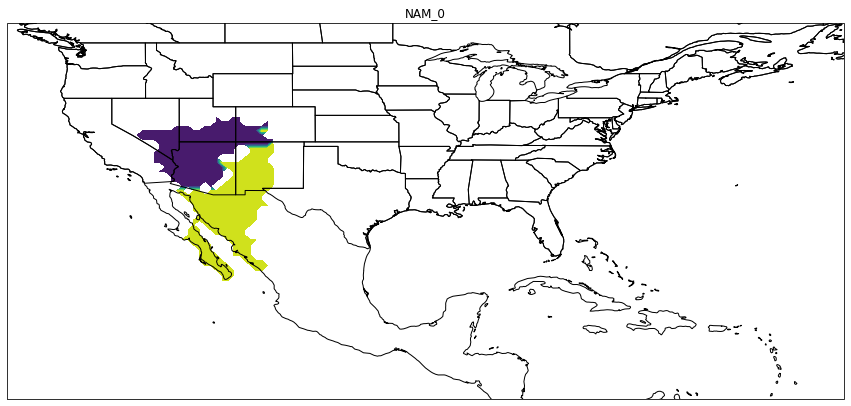

In [64]:
NAM_2 = struct_nam_0.copy()
NAM_2 = NAM_2.reshape(-1,1)

print(np.unique(NAM_2, return_counts=True))
NAM_2[nam_1>=11]=1
print(np.unique(NAM_2, return_counts=True))
struct_NAM_01 = NAM_2.reshape(80, 148)

fig = plt.figure(figsize=(15, 15))
ax = plt.subplot(projection=ccrs.LambertCylindrical())
plt.title(f"NAM_0")
print(lon.shape, ' ', lat.shape)
x, y = np.meshgrid(lon, lat)
# Plot the data
masked_nam= np.ma.array(struct_NAM_01, mask=struct_NAM_01<0)
palette = copy.copy(mpl.cm.get_cmap("tab20", 2))
palette.set_bad('b', 0)
tplot = ax.contourf(x, y, masked_nam.reshape(80, 148), transform=ccrs.PlateCarree())
ax.set_extent((230.75, 304.75, 11.75, 51.75), crs=ccrs.PlateCarree())

ax.add_feature(cfeature.COASTLINE.with_scale('50m'))
ax.add_feature(cfeature.STATES.with_scale('50m'))
plt.show()

In [65]:
# np.save('nam_01', struct_NAM_01)